# 前期准备


In [1]:
! export MNE_3D_OPTION_MULTI_SAMPLES=1
! export MNE_3D_OPTION_ANTIALIAS=false
! export MESA_GL_VERSION_OVERRIDE=3.3
! export LIBGL_ALWAYS_SOFTWARE=true

In [2]:
import os

os.environ['DISPLAY'] = ':99'

In [3]:
! mne sys_info

Platform             Linux-5.15.0-60-generic-x86_64-with-glibc2.35
Python               3.9.20 | packaged by conda-forge | (main, Sep 30 2024, 17:49:10)  [GCC 13.3.0]
Executable           /root/anaconda3/envs/mne/bin/python3.9
CPU                  x86_64 (64 cores)
Memory               487.5 GB

Core
├☑ mne               1.8.0 (unable to check for latest version on GitHub, timeout after 2.0 sec)
├☑ numpy             1.26.4 (OpenBLAS 0.3.28 with 64 threads)
├☑ scipy             1.13.1
└☑ matplotlib        3.9.1 (backend=module://matplotlib_inline.backend_inline)

Numerical (optional)
├☑ sklearn           1.5.2
├☑ numba             0.60.0
├☑ nibabel           5.3.2
├☑ nilearn           0.10.4
├☑ dipy              1.9.0
├☑ openmeeg          2.5.12
├☑ cupy              13.3.0
├☑ pandas            2.2.3
├☑ h5io              0.2.4
└☑ h5py              3.12.1

Visualization (optional)
├☑ pyvista           0.44.1 (OpenGL 4.5 (Core Profile) Mesa 23.2.1-1ubuntu3.1~22.04.2 via llvmpipe (LLVM 15.0

In [4]:
import mne
import matplotlib

mne.viz.set_3d_backend("pyvistaqt", verbose='INFO')
mne.viz.set_3d_options(antialias=False)

Using pyvistaqt 3d backend.


In [5]:
mne.viz.set_browser_backend('matplotlib')

Using matplotlib as 2D backend.


In [6]:
mne.utils.set_config('MNE_USE_CUDA', 'true')


In [7]:
matplotlib.use('Agg')

In [8]:
%matplotlib inline

# EEG数据加载与处理
## 加载EEG数据
选取数据为BrainLat于2023年发布的公开数据集（EEG数据公开而MRI数据需要申请）
[数据链接](https://doi.org/10.7303/syn51549340)
> [1] P. Prado et al., ‘The BrainLat project, a multimodal neuroimaging dataset of neurodegeneration from underrepresented backgrounds’, Sci Data, vol. 10, no. 1, p. 889, Dec. 2023, doi: 10.1038/s41597-023-02806-8.

### 实验设备信息：
|实验设备|信息|
|:---:|:---:|
|采集系统|Biosemi Active II|
|电极分布|Biosemi 128|
|参考方式|乳突（Linked mastoids）|
|模拟滤波器|0.03 – 100 Hz|

### 原文所采取处理步骤有：
|处理|参数|
|:---:|:---:|
|数字滤波器|0.5 – 40 Hz|
|采样率|512 Hz|
|参考方式|平均参考|

这里选择一个阿尔兹海默症患者的数据作为实验对象


In [9]:
from pathlib import Path

eeg_data_path = Path('/zjhszu2023/sub-CLB00006/eeg')
raw_fname = eeg_data_path   / 's6_sub-30006_rs-hep_eeg.set'
raw = mne.io.read_raw_eeglab(raw_fname)
raw.info

/tmp/ipykernel_133/1436617187.py:5: RuntimeWarning: Data will be preloaded. preload=False or a string preload is not supported when the data is stored in the .set file
  raw = mne.io.read_raw_eeglab(raw_fname)


<Info | 8 non-empty values
 bads: []
 ch_names: A1, A2, A3, A4, A5, A6, A7, A8, A9, A10, A11, A12, A13, A14, ...
 chs: 128 EEG
 custom_ref_applied: False
 dig: 131 items (3 Cardinal, 128 EEG)
 highpass: 0.0 Hz
 lowpass: 256.0 Hz
 meas_date: unspecified
 nchan: 128
 projs: []
 sfreq: 512.0 Hz
>

## 电极定位
### 查看电极定位模板

In [10]:
builtin_montages = mne.channels.get_builtin_montages(descriptions=True)
for montage_name, montage_description in builtin_montages:
    print(f"{montage_name}: {montage_description}")

standard_1005: Electrodes are named and positioned according to the international 10-05 system (343+3 locations)
standard_1020: Electrodes are named and positioned according to the international 10-20 system (94+3 locations)
standard_alphabetic: Electrodes are named with LETTER-NUMBER combinations (A1, B2, F4, …) (65+3 locations)
standard_postfixed: Electrodes are named according to the international 10-20 system using postfixes for intermediate positions (100+3 locations)
standard_prefixed: Electrodes are named according to the international 10-20 system using prefixes for intermediate positions (74+3 locations)
standard_primed: Electrodes are named according to the international 10-20 system using prime marks (' and '') for intermediate positions (100+3 locations)
biosemi16: BioSemi cap with 16 electrodes (16+3 locations)
biosemi32: BioSemi cap with 32 electrodes (32+3 locations)
biosemi64: BioSemi cap with 64 electrodes (64+3 locations)
biosemi128: BioSemi cap with 128 electrodes (1

### 选择Biosemi128模板进行电极定位
论文原文描述提及使用便是128通道的biosemi
> a 128-channel Biosemi Active-two acquisition system (pin-type active, sintered Ag-AgCl electrodes).

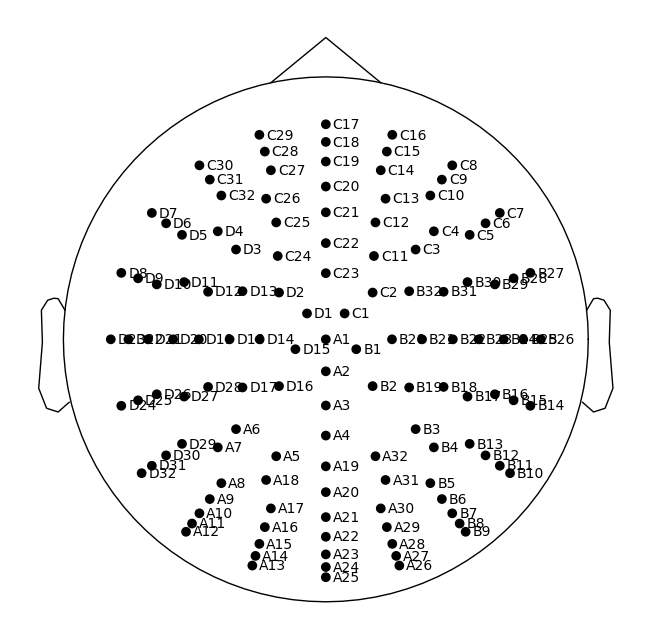

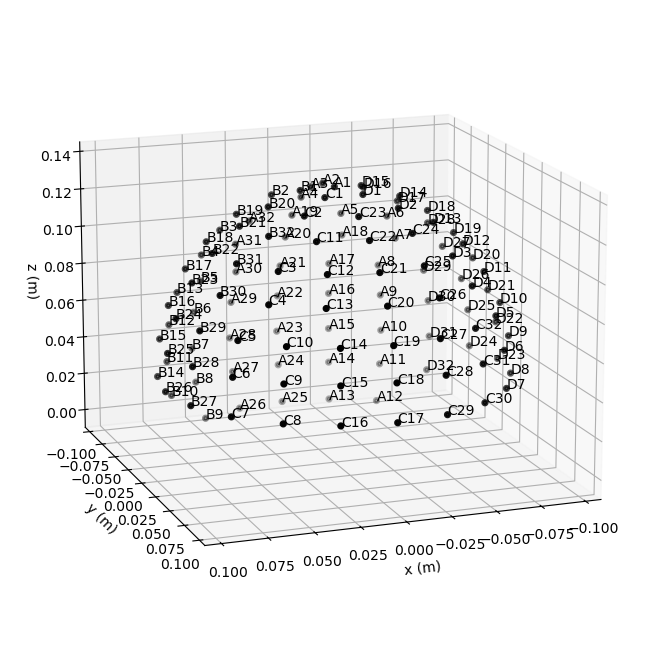

In [11]:
montage = mne.channels.make_standard_montage("biosemi128")
# 2D
montage.plot()
# 3D
fig = montage.plot(kind="3d", show=False)
fig = fig.gca().view_init(azim=70, elev=15)

In [12]:
raw.set_montage(montage,
                on_missing='warn',
                match_case=False,
                match_alias=True,)

<RawEEGLAB | s6_sub-30006_rs-hep_eeg.set, 128 x 317576 (620.3 s), ~310.3 MB, data loaded>

## 数据分析
### 能量谱分析 compute_psd

Effective window size : 4.000 (s)
Plotting power spectral density (dB=True).


/root/anaconda3/envs/mne/lib/python3.9/site-packages/mne/viz/utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


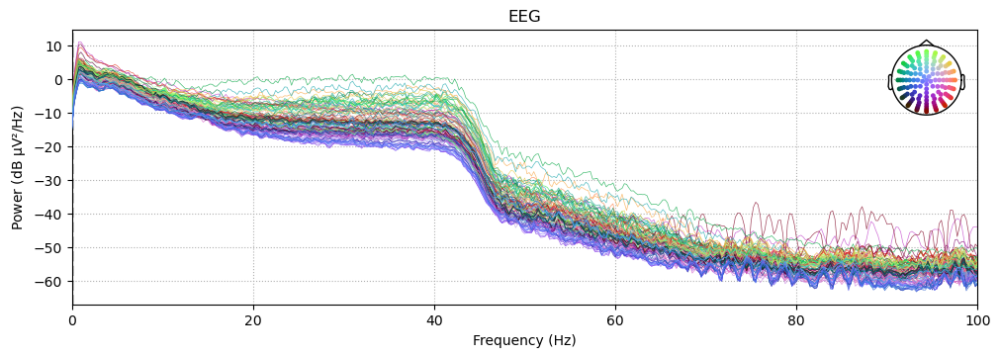

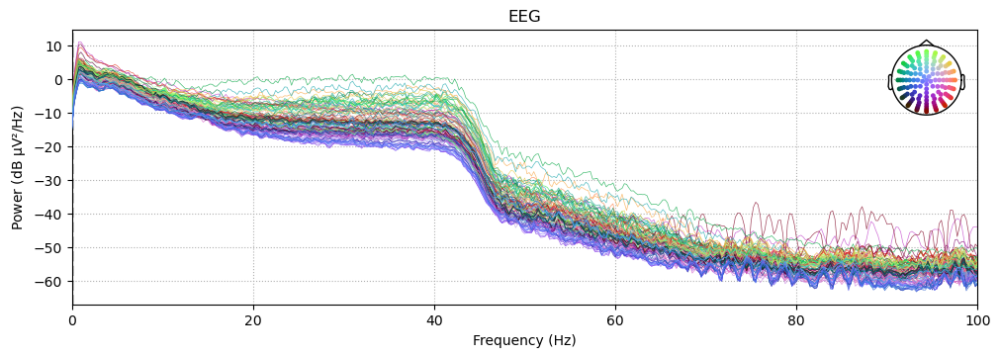

In [13]:
raw.compute_psd(fmax=100).plot(picks="eeg", exclude="bads", amplitude=False)

### 绘制不同通道的时序图

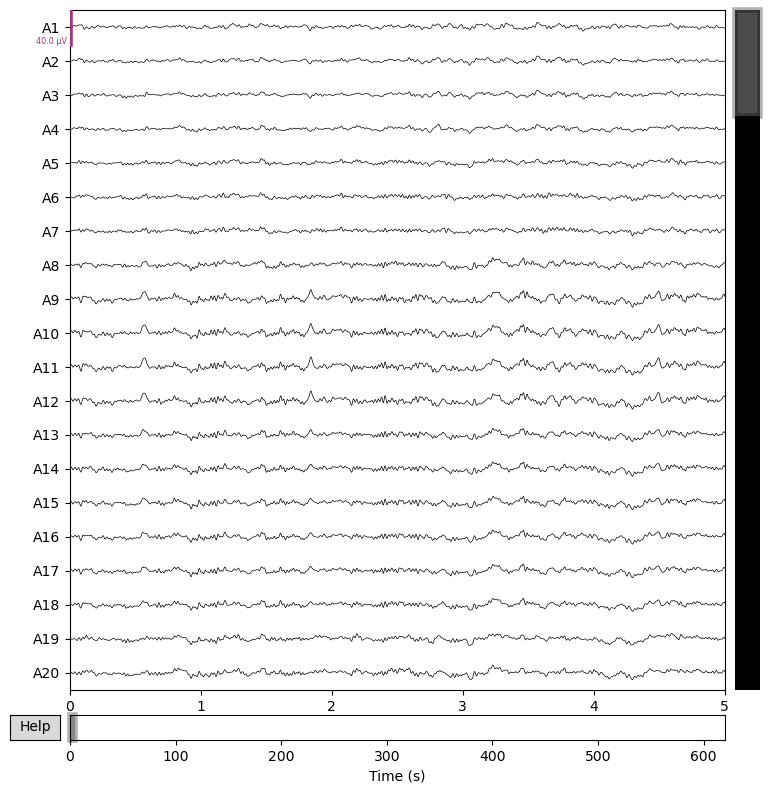

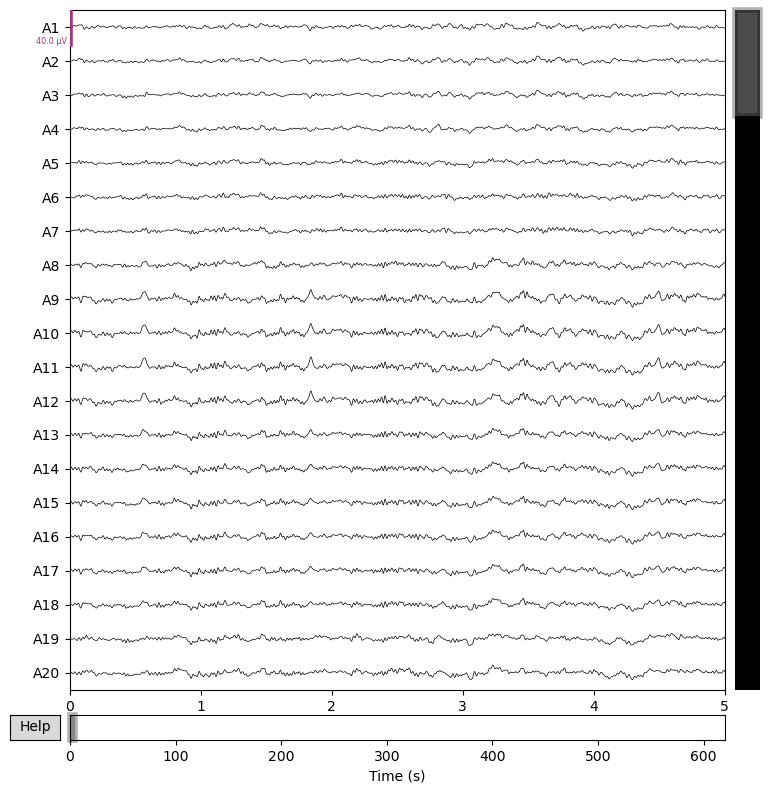

In [14]:
raw.plot(duration=5, n_channels=20)

## 加载事件

In [15]:
import pandas as pd

input_file = eeg_data_path/'sub-clb00006_rs-hep_events.tsv'
output_file = eeg_data_path/'mne-sub-clb00006_rs-hep-eve.txt'

df = pd.read_csv(input_file, sep='\t')

print(df.head())
print(df.columns)

event_text_col = df.columns[0]
event_time_col = df.columns[1]

event_labels = {label: idx for idx, label in enumerate(df[event_text_col].unique())}
df['event_id'] = df[event_text_col].map(event_labels) + 1
df['bad'] = 0

mne_events = df[[event_time_col, 'bad','event_id']].rename(columns={event_time_col: 'time'})

mne_events.to_csv(output_file, sep='\t', index=False, header=False)

print(f"New event file saved as {output_file}")
mne_events.head()

   TrialType  Onset_ms
0  HeartBeat     294.5
1  HeartBeat     947.0
2  HeartBeat    1632.5
3  HeartBeat    2304.0
4  HeartBeat    2982.5
Index(['TrialType', 'Onset_ms'], dtype='object')
New event file saved as /zjhszu2023/sub-CLB00006/eeg/mne-sub-clb00006_rs-hep-eve.txt


,time,bad,event_id
0,294.5,0,1
1,947.0,0,1
2,1632.5,0,1
3,2304.0,0,1
4,2982.5,0,1


In [16]:
events = mne.read_events(filename=output_file)
events[:5]

array([[ 294,    0,    1],
       [ 947,    0,    1],
       [1632,    0,    1],
       [2304,    0,    1],
       [2982,    0,    1]])

In [17]:
mapping = {
    1: "HeartBeat",
}
annot_from_events = mne.annotations_from_events(
    events=events,
    event_desc=mapping,
    sfreq=raw.info["sfreq"],
    orig_time=raw.info["meas_date"],
)
raw.set_annotations(annot_from_events)

<RawEEGLAB | s6_sub-30006_rs-hep_eeg.set, 128 x 317576 (620.3 s), ~310.3 MB, data loaded>

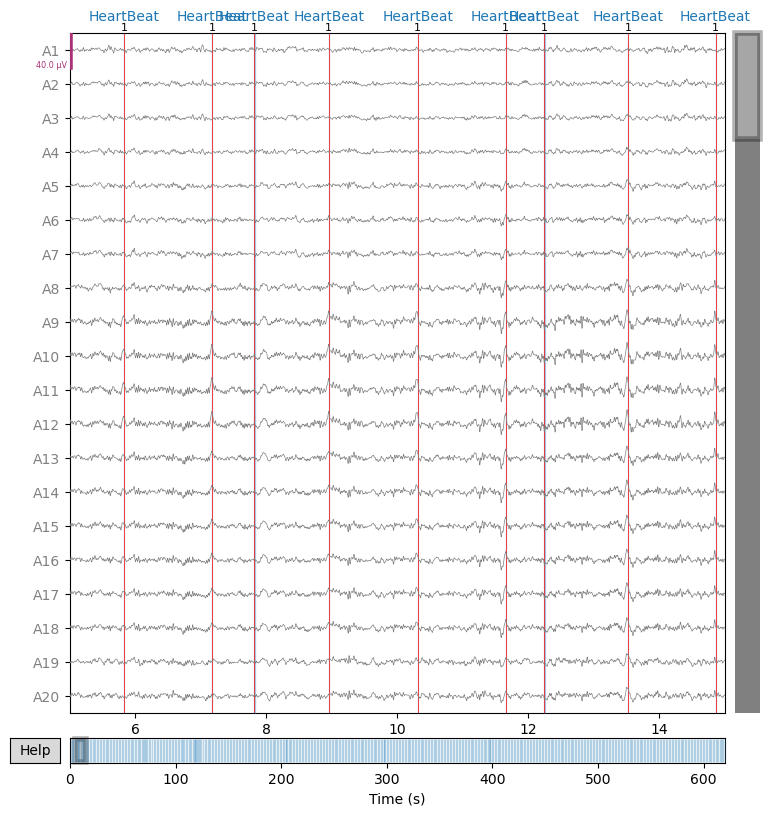

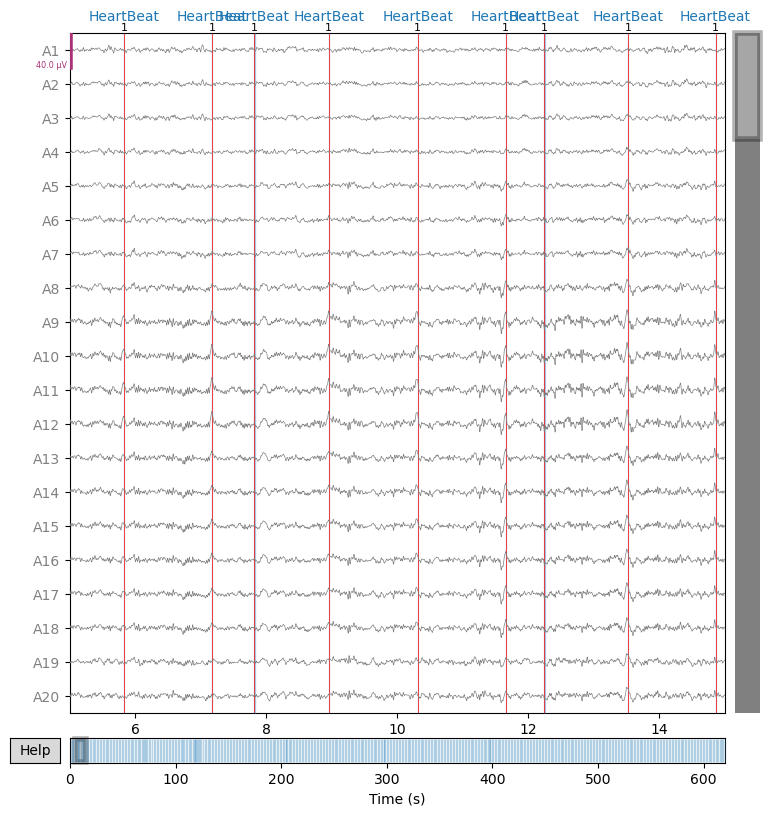

In [18]:
raw.plot(
    events=events,
    start=5,
    duration=10,
    color="gray",
    event_color={1: "r"},
)

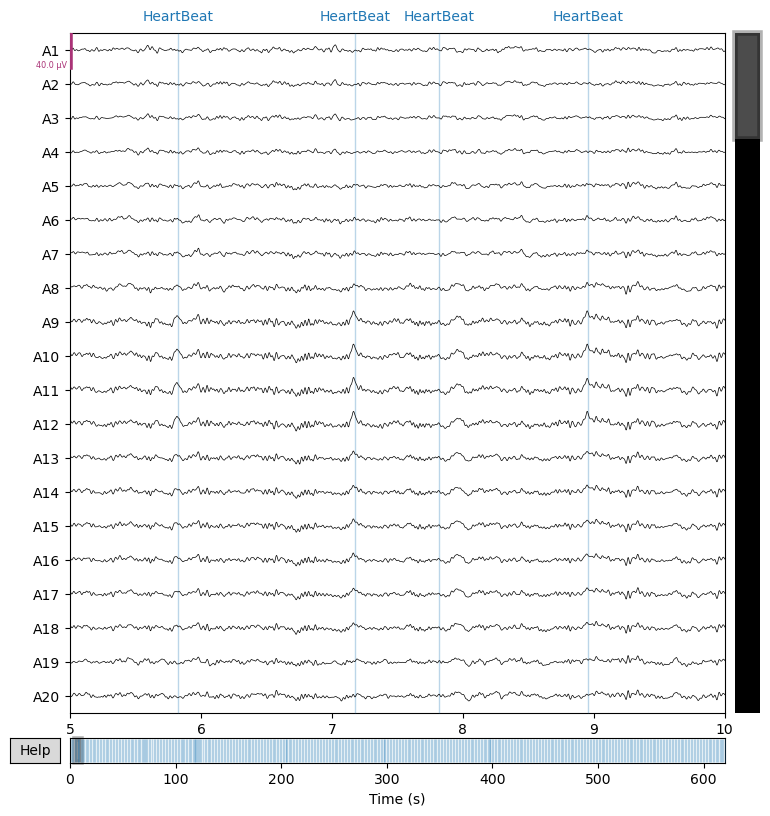

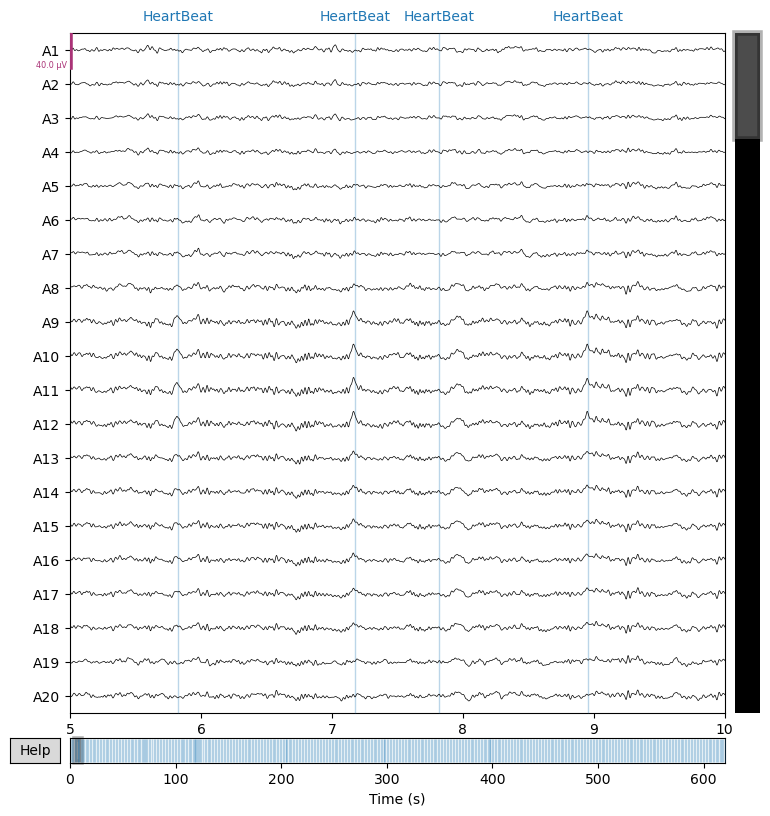

In [19]:
raw.plot(start=5, duration=5)

In [20]:
epochs = mne.Epochs(raw,
                    events,
                    tmin=-0.2, tmax=0.1,
)
epochs.load_data()

Not setting metadata
458 matching events found
Setting baseline interval to [-0.19921875, 0.0] s
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 458 events and 154 original time points ...
0 bad epochs dropped


<Epochs | 458 events (all good), -0.199 – 0.1 s (baseline -0.199 – 0 s), ~69.0 MB, data loaded,
 '1': 458>

You seem to have overlapping epochs. Some event lines may be duplicated in the plot.


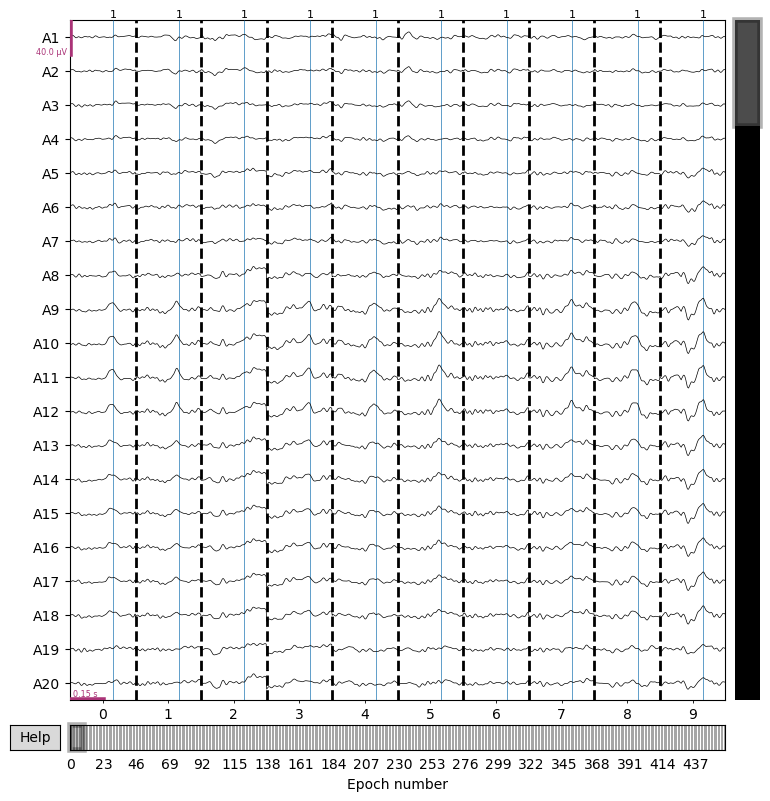

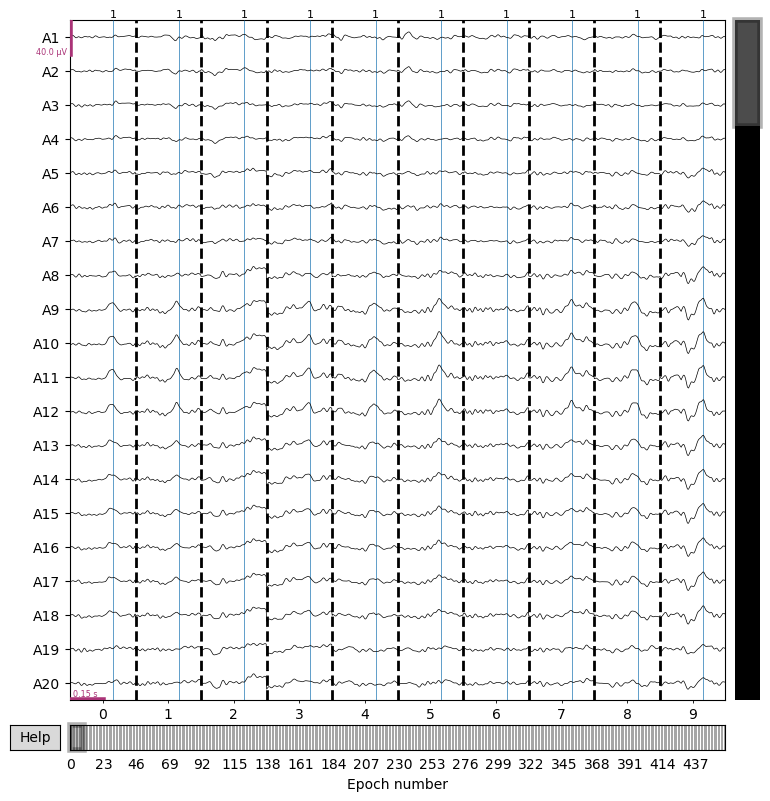

In [21]:
epochs.plot(n_epochs=10, events=True)

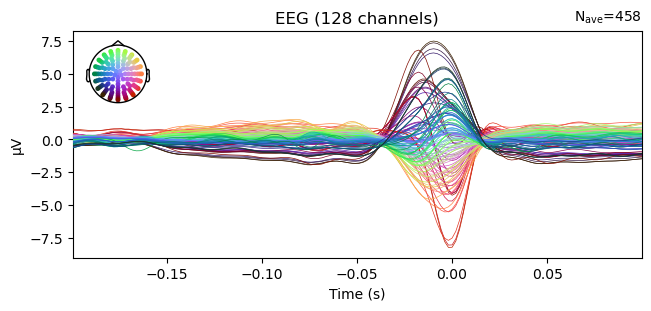

In [22]:
heart_beat = epochs['1'].average()
fig = heart_beat.plot(spatial_colors=True)

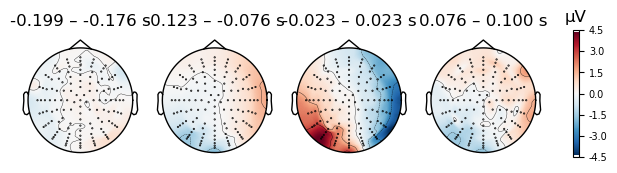

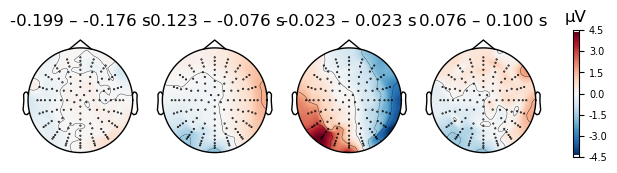

In [23]:
heart_beat.plot_topomap(times='auto' , average=0.05)

# 使用Freesurfer构建前向头模型
- FreeSurfer 是一个用于 MRI 数据的开源分析工具箱。
- FreeSurfer 提供用于可视化 MRI 数据的图形界面、用于创建感兴趣区域 (ROI) 标签的几种解剖分区、模板大脑（例如fsaverage）以及几种命令行工具（用于查找组织边界或变形大脑以在受试者之间对齐类似的解剖区域）。
## 重建大脑皮层
- FreeSurfer 执行半球分离，因此大多数生成的文件都有单独的左半球和右半球版本，由前缀 lh或表示rh。这种半球分离由 MNE-Python 保留（例如， mne.SourceEstimate对象分别存储两个半球的空间位置
- FreeSurfer 提供名为`fsaverage`的大脑模板，这个模板结合了40个真实大脑MRI图像，其中包含了绝大部分研究所需的文件

In [24]:
import ipywidgets as widgets

from IPython.display import display
from IPython.display import Image

from datetime import datetime
import matplotlib.pyplot as plt
from pathlib import Path

def show_PyVista(fig):
    screenshot = fig.plotter.screenshot()
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.imshow(screenshot, origin='upper')
    ax.set_axis_off()
    fig.tight_layout()
    fig.savefig('fig.png', dpi=150)

In [40]:
data_path = Path('/usr/local/freesurfer/8.0.0-beta/')
subjects_dir = data_path / "subjects"
subject = 'clb00006'
Brain = mne.viz.get_brain_class()
brain = Brain(
    subject, hemi="lh", surf="pial",
    subjects_dir=subjects_dir, size=(800, 600)
)
brain.add_annotation("aparc.a2009s", borders=False)

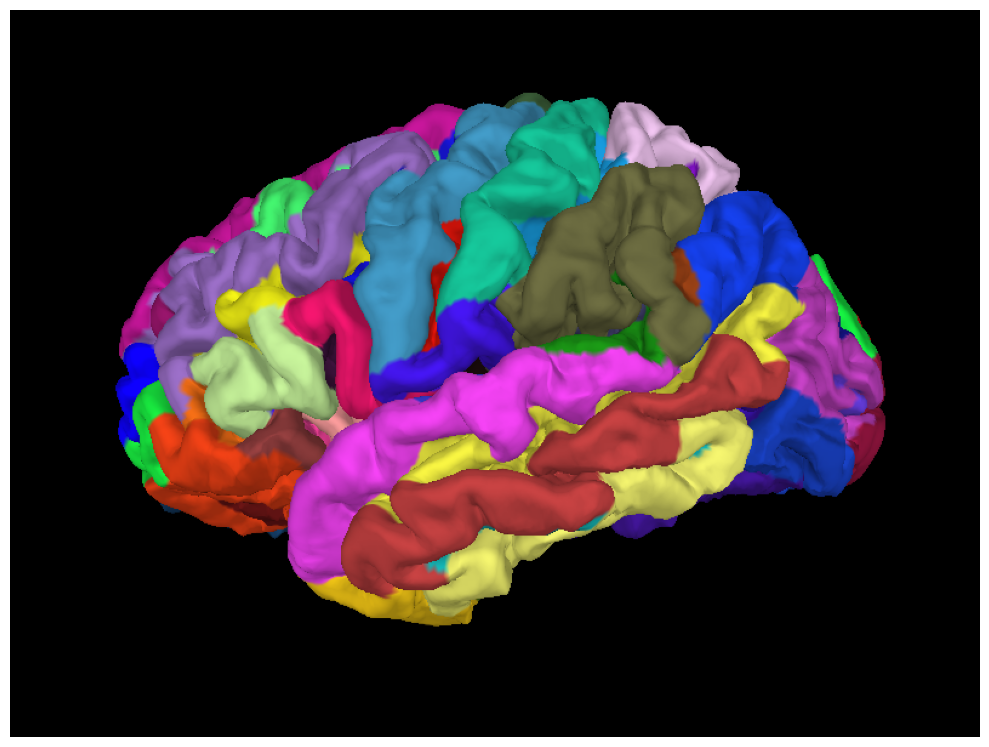

In [41]:
show_PyVista(brain)

## 导入MRI数据
根据`brainlat_records_mri.csv`找到对应的数据
|MRI_ID|EEG_ID|diagnosis|T1|Rest|DWI|MF|eeg|
|---|---|---|---|---|---|---|---|
|sub-CLB00006|sub-30006|AD|1|1|0|3|1|


In [29]:
import nibabel as nib
import numpy as np
from scipy import linalg

from mne.io.constants import FIFF

mri_data_path = Path('/zjhszu2023/sub-CLB00006')
t1w = nib.load(mri_data_path / "anat" / "sub-clb00006_t1w.nii.gz")

# 创建一个新的 Nifti1Image 对象，使用加载的图像数据和仿射矩阵
t1w = nib.Nifti1Image(t1w.dataobj, t1w.affine)

# 设置图像头信息中的 xyzt_units，表示图像的空间单位
# 这里 np.array(10, dtype="uint8") 表示单位为毫米
t1w.header["xyzt_units"] = np.array(10, dtype="uint8")

# 将 Nifti1Image 转换为 MGHImage 对象
t1_mgh = nib.MGHImage(t1w.dataobj, t1w.affine)

t1_mgh

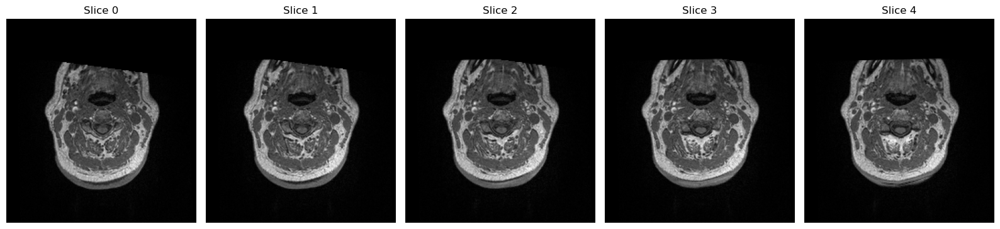

In [30]:
data = t1_mgh.get_fdata()

num_slices = 5
slice_indices = range(num_slices)

fig, axes = plt.subplots(1, num_slices, figsize=(16, 6))

for i, slice_index in enumerate(slice_indices):
    slice_data = data[:, :, slice_index]
    axes[i].imshow(slice_data.T, cmap='gray', origin='lower')  # 转置以正确显示
    axes[i].set_title(f'Slice {slice_index}')
    axes[i].axis('off')

plt.tight_layout()
plt.show()

## 坐标系对齐
对于MEG/EEG源成像，需要使用两个变换矩阵将三个坐标系对齐
- MEG/EEG：MEG/EEG传感器物理位置的坐标框架
- MRI：MRI图像的坐标框架，以及从MRI图像得出的头皮、头骨和大脑表面
- 头部：数字化传感器位置和头皮标志（基准点）的坐标框架
### 使用自动化方法进行配准
#### 设置核心注册

In [42]:
from mne.coreg import Coregistration

info = raw.info
plot_kwargs = dict(
    subject=subject,
    subjects_dir=subjects_dir,
    surfaces="head",
    dig=True,
    eeg='original',
    # meg="sensors",
    show_axes=True,
    coord_frame="mri",
    sensor_colors={'eeg':'red'}
)

    Triangle neighbors and vertex normals...
Using low resolution head model in /usr/local/freesurfer/8.0.0-beta/subjects/clb00006/bem/outer_skin.surf
    Triangle neighbors and vertex normals...
Estimating fiducials from fsaverage.
Using outer_skin.surf for head surface.
Channel types::	eeg: 128


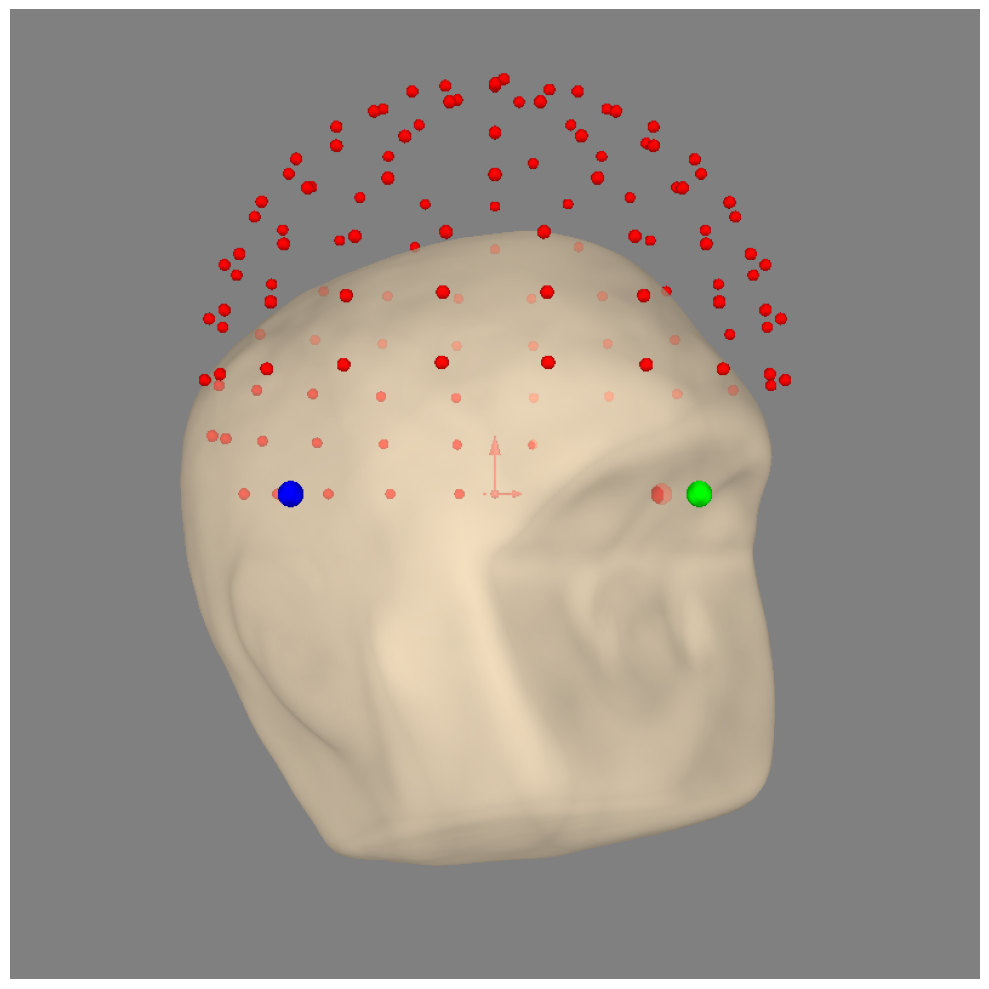

In [43]:
fiducials = "auto"
coreg = Coregistration(info, subject, subjects_dir, fiducials=fiducials)
fig = mne.viz.plot_alignment(info, trans=coreg.trans, **plot_kwargs)

view_kwargs = dict(azimuth=45, elevation=90, distance=0.6, focalpoint=(0.0, 0.0, 0.0))
mne.viz.set_3d_view(fig, **view_kwargs)

show_PyVista(fig)

### 初始拟合基准点

Aligning using fiducials
Start median distance:  27.52 mm
End   median distance:   9.34 mm
Using outer_skin.surf for head surface.
Channel types::	eeg: 128


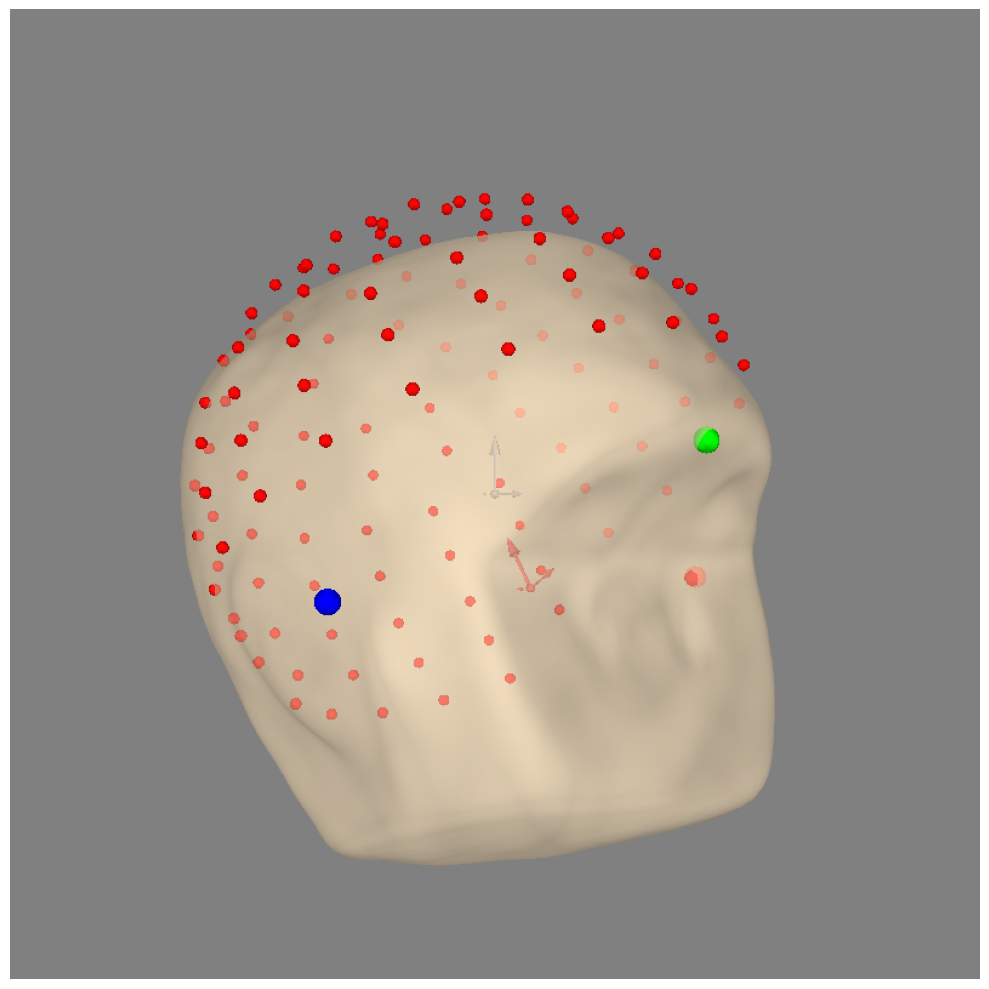

In [44]:
coreg.fit_fiducials(verbose=True)
fig = mne.viz.plot_alignment(info, trans=coreg.trans, **plot_kwargs)
mne.viz.set_3d_view(fig, **view_kwargs)

show_PyVista(fig)

### 使用ICP精炼

Aligning using ICP
Start     median distance:   9.34 mm
  ICP  1  median distance:   6.58 mm
  ICP  2  median distance:   5.33 mm
  ICP  3  median distance:   4.63 mm
  ICP  4  median distance:   4.17 mm
  ICP  5  median distance:   3.93 mm
  ICP  6  median distance:   3.75 mm
End       median distance:   3.75 mm
Using outer_skin.surf for head surface.
Channel types::	eeg: 128


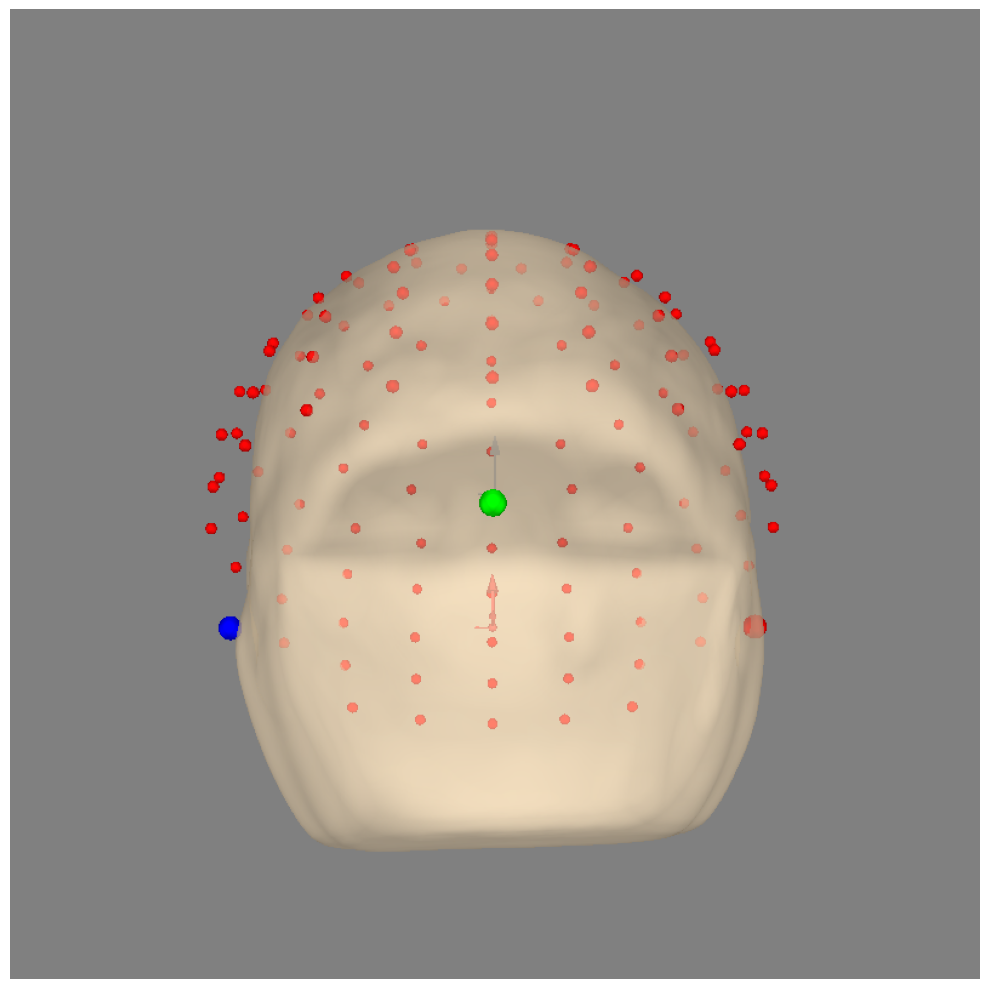

In [45]:
coreg.fit_icp(n_iterations=6, nasion_weight=2.0, verbose=True)
fig = mne.viz.plot_alignment(info, trans=coreg.trans, **plot_kwargs)
# mne.viz.set_3d_view(fig, **view_kwargs)

show_PyVista(fig)

### 去除坏点

In [46]:
coreg.omit_head_shape_points(distance=5.0 / 1000)  # distance is in meters

Coregistration: Excluding 0 head shape points with distance >= 0.005 m.


### 最终配准适配

Aligning using ICP
Start     median distance:   3.75 mm
  ICP  1  median distance:   3.75 mm
  ICP  2  median distance:   3.70 mm
  ICP  3  median distance:   3.71 mm
  ICP  4  median distance:   3.57 mm
  ICP  5  median distance:   3.49 mm
  ICP  6  median distance:   3.53 mm
  ICP  7  median distance:   3.46 mm
  ICP  8  median distance:   3.26 mm
  ICP  9  median distance:   3.27 mm
  ICP 10  median distance:   3.33 mm
End       median distance:   3.33 mm
Using outer_skin.surf for head surface.
Channel types::	eeg: 128
Distance between HSP and MRI (mean/min/max):
4.32 mm / 0.86 mm / 13.29 mm


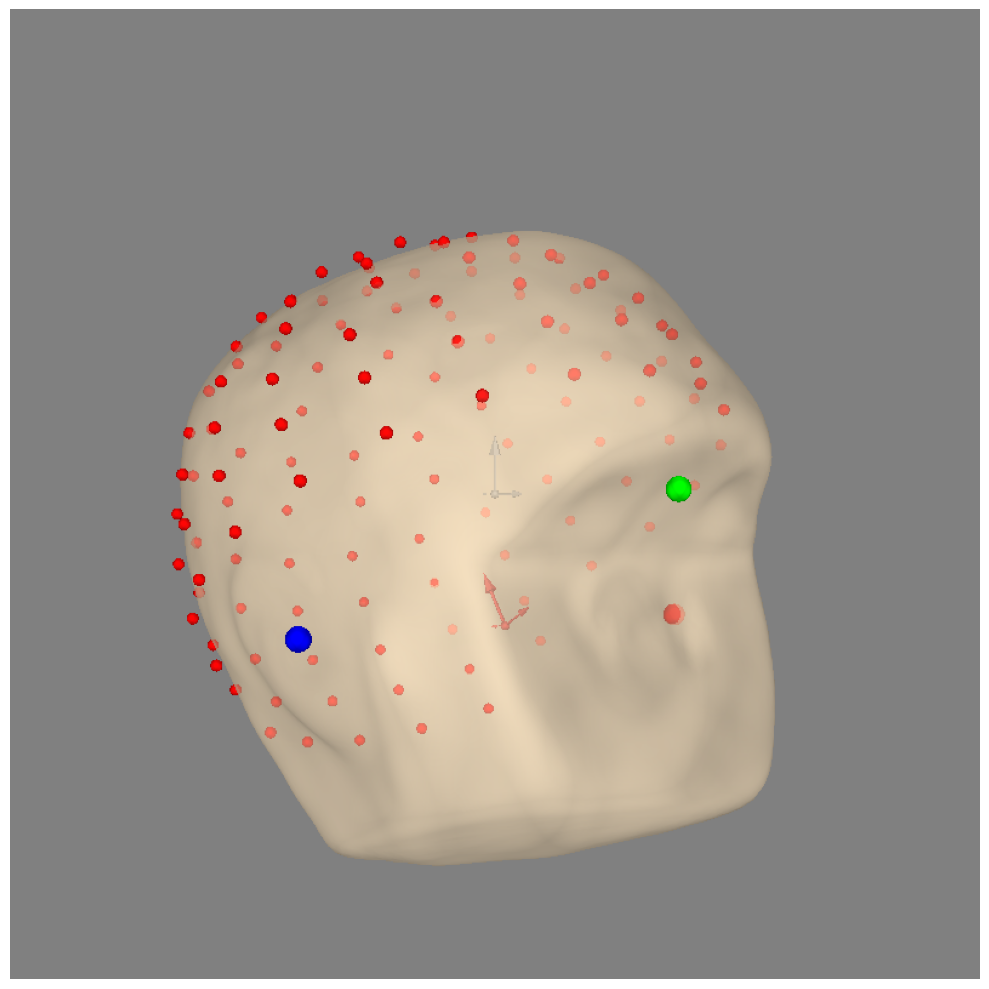

In [47]:
coreg.fit_icp(n_iterations=20, nasion_weight=10.0, verbose=True)
fig = mne.viz.plot_alignment(info, trans=coreg.trans, **plot_kwargs)
mne.viz.set_3d_view(fig, **view_kwargs)
show_PyVista(fig)
dists = coreg.compute_dig_mri_distances() * 1e3  # in mm
print(
    f"Distance between HSP and MRI (mean/min/max):\n{np.mean(dists):.2f} mm "
    f"/ {np.min(dists):.2f} mm / {np.max(dists):.2f} mm"
)

### 保存适配后的trans矩阵

In [48]:
mne.write_trans('/usr/local/freesurfer/8.0.0-beta/subjects/clb00006/bem/trans.fif', coreg.trans,overwrite=True)

/tmp/ipykernel_133/2157391695.py:1: RuntimeWarning: This filename (/usr/local/freesurfer/8.0.0-beta/subjects/clb00006/bem/trans.fif) does not conform to MNE naming conventions. All trans files should end with -trans.fif, -trans.fif.gz, _trans.fif or _trans.fif.gz
  mne.write_trans('/usr/local/freesurfer/8.0.0-beta/subjects/clb00006/bem/trans.fif', coreg.trans,overwrite=True)


## 构建头模型
### 计算前向算子
所需部分：
1. `-trans.fif`包含核心注册信息的文件
2. 源空间
3. BEM表面
### 计算并可视化BEM表面

Using surface: /usr/local/freesurfer/8.0.0-beta/subjects/clb00006/bem/inner_skull.surf
Using surface: /usr/local/freesurfer/8.0.0-beta/subjects/clb00006/bem/outer_skull.surf
Using surface: /usr/local/freesurfer/8.0.0-beta/subjects/clb00006/bem/outer_skin.surf


/root/anaconda3/envs/mne/lib/python3.9/site-packages/mne/viz/utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


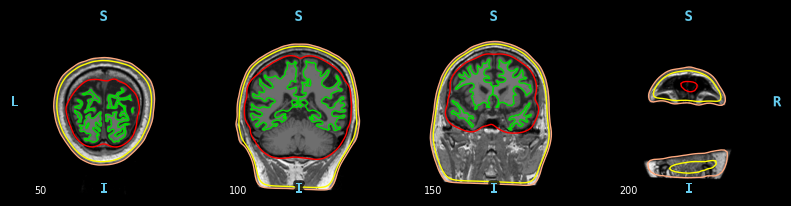

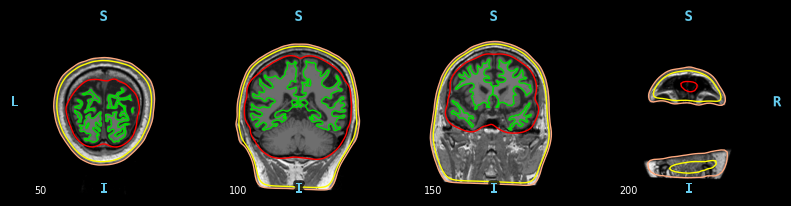

In [49]:
plot_bem_kwargs = dict(
    subject=subject,
    subjects_dir=subjects_dir,
    brain_surfaces="white",
    orientation="coronal",
    slices=[50, 100, 150, 200],
)

mne.viz.plot_bem(**plot_bem_kwargs)

### 计算源空间
#### 分类
- 当候选对象被限制在表面时，**基于表面的源空间**——mne.setup_source_space()
- 当候选点是离散的、任意位置的、由表面界定的源点时，**体积或离散源空间**——mne.setup_volume_source_space()

In [50]:
src = mne.setup_source_space(
    subject, spacing="oct6", add_dist="patch", subjects_dir=subjects_dir
)
print(src)

Setting up the source space with the following parameters:

SUBJECTS_DIR = /usr/local/freesurfer/8.0.0-beta/subjects
Subject      = clb00006
Surface      = white
Octahedron subdivision grade 6

>>> 1. Creating the source space...

Doing the octahedral vertex picking...
Loading /usr/local/freesurfer/8.0.0-beta/subjects/clb00006/surf/lh.white...
Mapping lh clb00006 -> oct (6) ...
    Triangle neighbors and vertex normals...
Loading geometry from /usr/local/freesurfer/8.0.0-beta/subjects/clb00006/surf/lh.sphere...
Setting up the triangulation for the decimated surface...
loaded lh.white 4098/140868 selected to source space (oct = 6)

Loading /usr/local/freesurfer/8.0.0-beta/subjects/clb00006/surf/rh.white...
Mapping rh clb00006 -> oct (6) ...
    Triangle neighbors and vertex normals...
Loading geometry from /usr/local/freesurfer/8.0.0-beta/subjects/clb00006/surf/rh.sphere...
Setting up the triangulation for the decimated surface...
loaded rh.white 4098/143363 selected to source space (oc

- 基于表面的源空间src包含两个部分，一个用于左半球（258 个位置），另一个用于右半球（258 个位置）。源可以在 BEM 表面上以紫色显示。

Using surface: /usr/local/freesurfer/8.0.0-beta/subjects/clb00006/bem/inner_skull.surf
Using surface: /usr/local/freesurfer/8.0.0-beta/subjects/clb00006/bem/outer_skull.surf
Using surface: /usr/local/freesurfer/8.0.0-beta/subjects/clb00006/bem/outer_skin.surf


/root/anaconda3/envs/mne/lib/python3.9/site-packages/mne/viz/utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


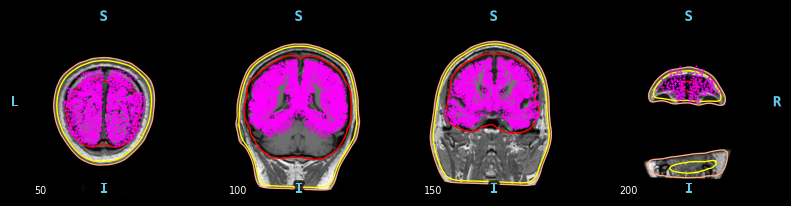

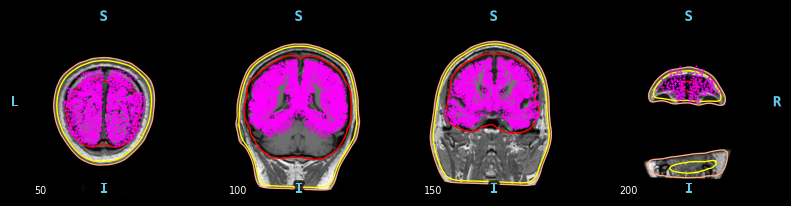

In [51]:
mne.viz.plot_bem(src=src, **plot_bem_kwargs)

- 要计算基于体积的源空间，可以使用以下代码，该源空间由以 (0.0, 0.0, 0.0) 毫米为中心的半径为 80 毫米的球体内的候选偶极子网格定义。
- 显然，这里的球体并不完美。它并不局限于大脑，而且可能会遗漏皮层的某些部分。

Sphere                : origin at (0.0 0.0 0.0) mm
              radius  : 80.0 mm
grid                  : 5.0 mm
mindist               : 5.0 mm
MRI volume            : /usr/local/freesurfer/8.0.0-beta/subjects/clb00006/mri/T1.mgz

Reading /usr/local/freesurfer/8.0.0-beta/subjects/clb00006/mri/T1.mgz...

Setting up the sphere...
Surface CM = (   0.0    0.0    0.0) mm
Surface fits inside a sphere with radius   80.0 mm
Surface extent:
    x =  -80.0 ...   80.0 mm
    y =  -80.0 ...   80.0 mm
    z =  -80.0 ...   80.0 mm
Grid extent:
    x =  -85.0 ...   85.0 mm
    y =  -85.0 ...   85.0 mm
    z =  -85.0 ...   85.0 mm
42875 sources before omitting any.
17077 sources after omitting infeasible sources not within 0.0 - 80.0 mm.
13997 sources remaining after excluding the sources outside the surface and less than    5.0 mm inside.
Adjusting the neighborhood info.
Source space : MRI voxel -> MRI (surface RAS)
    0.005000 0.000000 0.000000     -85.00 mm
    0.000000 0.005000 0.000000     -85.

/root/anaconda3/envs/mne/lib/python3.9/site-packages/mne/viz/utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


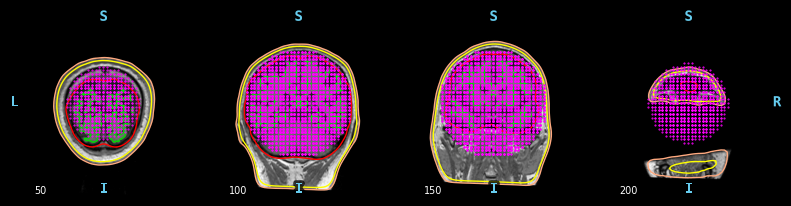

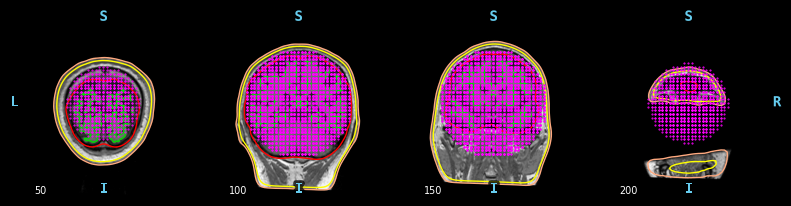

In [52]:
sphere = (0.0, 0.0, 0.00, 0.08)
vol_src = mne.setup_volume_source_space(
    subject,
    subjects_dir=subjects_dir,
    sphere=sphere,
    sphere_units="m",
    add_interpolator=False,
)
print(vol_src)

mne.viz.plot_bem(src=vol_src, **plot_bem_kwargs)

要计算由大脑内部候选偶极子网格定义的基于体积的源空间（需要BEM表面），可以使用以下命令

Boundary surface file : /usr/local/freesurfer/8.0.0-beta/subjects/clb00006/bem/watershed_brain_surface
grid                  : 5.0 mm
mindist               : 5.0 mm
MRI volume            : /usr/local/freesurfer/8.0.0-beta/subjects/clb00006/mri/T1.mgz

Reading /usr/local/freesurfer/8.0.0-beta/subjects/clb00006/mri/T1.mgz...

Loaded bounding surface from /usr/local/freesurfer/8.0.0-beta/subjects/clb00006/bem/watershed_brain_surface (10242 nodes)
Surface CM = (   0.6  -18.9   -0.8) mm
Surface fits inside a sphere with radius   94.3 mm
Surface extent:
    x =  -72.2 ...   71.9 mm
    y =  -92.6 ...   71.7 mm
    z =  -75.0 ...   66.0 mm
Grid extent:
    x =  -75.0 ...   75.0 mm
    y =  -95.0 ...   75.0 mm
    z =  -80.0 ...   70.0 mm
33635 sources before omitting any.
24981 sources after omitting infeasible sources not within 0.0 - 94.3 mm.
Source spaces are in MRI coordinates.
Checking that the sources are inside the surface and at least    5.0 mm away (will take a few...)
Checking surfa

/root/anaconda3/envs/mne/lib/python3.9/site-packages/mne/viz/utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


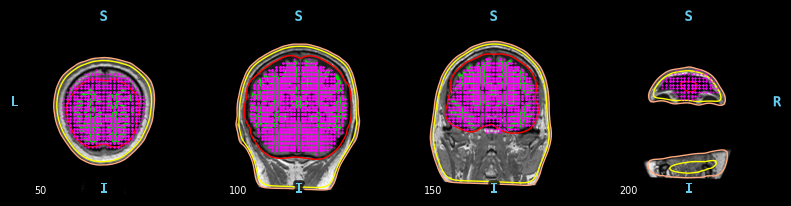

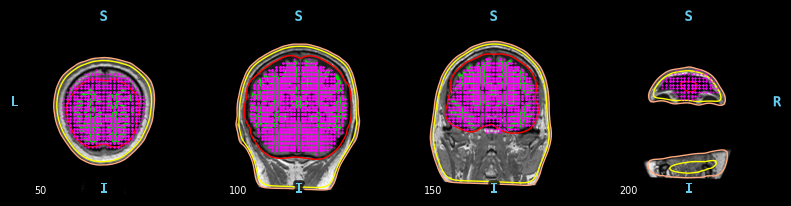

In [55]:
surface = subjects_dir / subject / "bem" / "watershed_brain_surface"
vol_src = mne.setup_volume_source_space(
    subject, subjects_dir=subjects_dir, surface=surface, add_interpolator=True
)
print(vol_src)

mne.viz.plot_bem(src=vol_src, **plot_bem_kwargs)

> 某些源可能看起来位于 BEM 内颅骨轮廓之外。这是因为它们slices在此处被抽取以进行绘制。图中的每个切片实际上代表多个 MRI 切片，但仅显示单个（给定切片范围的中点）切片的 MRI 体素和 BEM 边界，而绘制在该中点切片上的源空间点由该切片（在显示的所有切片中）最接近的所有点组成。

- 以 3D 形式查看所有源。

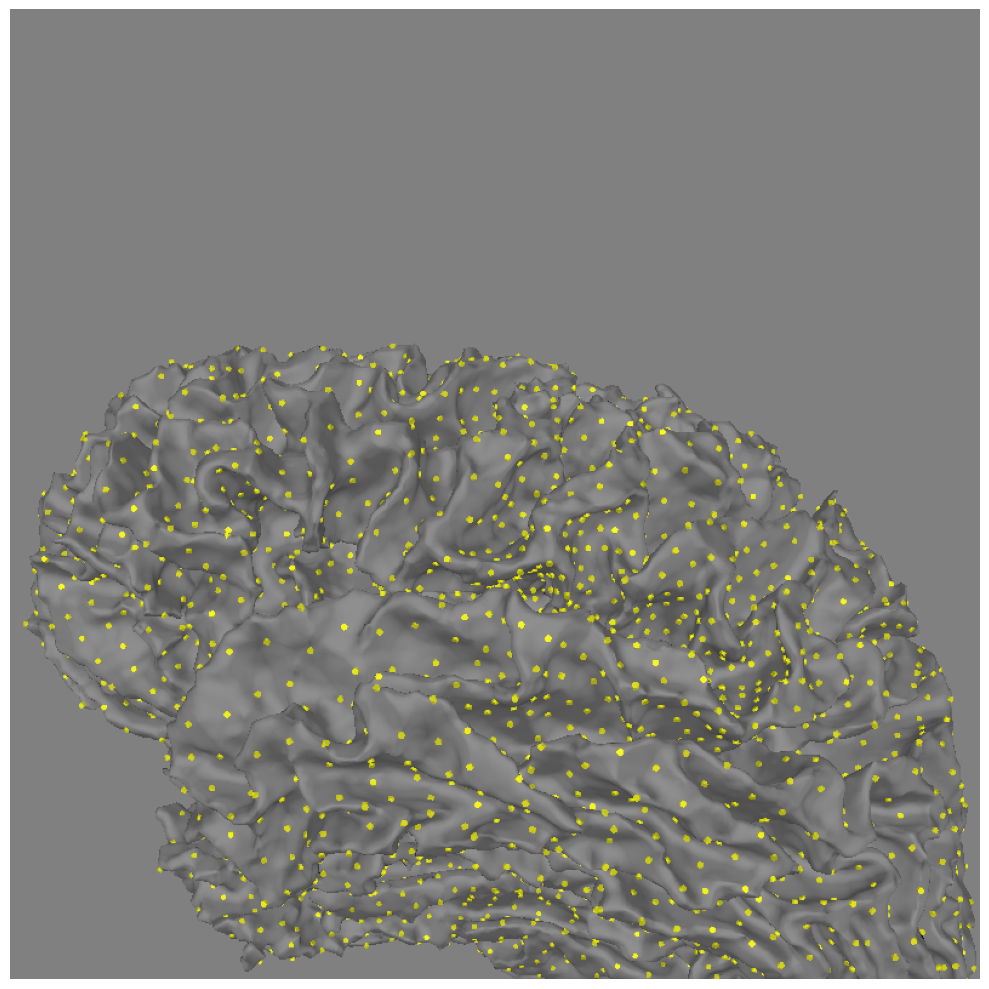

In [56]:
fig = mne.viz.plot_alignment(
    subject=subject,
    subjects_dir=subjects_dir,
    surfaces="white",
    coord_frame="mri",
    src=src,
)
mne.viz.set_3d_view(
    fig,
    azimuth=173.78,
    elevation=101.75,
    distance=0.30,
    focalpoint=(-0.03, -0.01, 0.03),
)
show_PyVista(fig)

### 计算正向解
#### 创建BEM模型
- BEM conductivity解需要一个 BEM 模型，该模型描述头部的几何形状和不同组织的电导率。

In [57]:
# conductivity = (0.3,)  # for single layer
# conductivity = (0.3, 0.006, 0.3)  # for three layers
# model = mne.make_bem_model(
#     subject=subject, ico=4, conductivity=conductivity, subjects_dir=subjects_dir
# )
# bem = mne.make_bem_solution(model)

In [58]:
# mne.write_bem_solution('/zjhszu2023/RumCode/BL_bem.h5', bem, overwrite=True)
bem = mne.read_bem_solution('/zjhszu2023/RumCode/BL_bem.h5')

Loading surfaces and solution...
Three-layer model surfaces loaded.
Loaded linear collocation BEM solution from /zjhszu2023/RumCode/BL_bem.h5


#### 计算前向算子，通常称为增益或引线场矩阵

In [59]:
info = raw.info
raw_info_fname = '/zjhszu2023/RumCode/raw_info.fif'
info.save(raw_info_fname)

In [60]:
fwd = mne.make_forward_solution(
    raw_info_fname,
    trans=coreg.trans,
    src=src,
    bem=bem,
    meg=False,
    eeg=True,
    mindist=5.0,
    n_jobs=None,
    verbose=True,
)
print(fwd)

Source space          : <SourceSpaces: [<surface (lh), n_vertices=140868, n_used=4098>, <surface (rh), n_vertices=143363, n_used=4098>] MRI (surface RAS) coords, subject 'clb00006', ~27.3 MB>
MRI -> head transform : instance of Transform
Measurement data      : raw_info.fif
Conductor model   : instance of ConductorModel
Accurate field computations
Do computations in head coordinates
Free source orientations

Read 2 source spaces a total of 8196 active source locations

Coordinate transformation: MRI (surface RAS) -> head
    0.999955 -0.008555 0.003978      -1.32 mm
    0.005244 0.854413 0.519568      17.07 mm
    -0.007844 -0.519524 0.854420      40.24 mm
    0.000000 0.000000 0.000000       1.00

Read 128 EEG channels from info
Head coordinate coil definitions created.
Source spaces are now in head coordinates.

Employing the head->MRI coordinate transform with the BEM model.
BEM model instance of ConductorModel is now set up

Source spaces are in head coordinates.
Checking that the 

In [61]:
print(f"Before: {src}")
print(f'After:  {fwd["src"]}')

Before: <SourceSpaces: [<surface (lh), n_vertices=140868, n_used=4098>, <surface (rh), n_vertices=143363, n_used=4098>] MRI (surface RAS) coords, subject 'clb00006', ~27.3 MB>
After:  <SourceSpaces: [<surface (lh), n_vertices=140868, n_used=4095>, <surface (rh), n_vertices=143363, n_used=4092>] head coords, subject 'clb00006', ~27.3 MB>


为了提取包含与皮质方向约束的源空间相对应的前向算子的 numpy 数组，fwd['src']可以使用以下命令

In [62]:
fwd_fixed = mne.convert_forward_solution(
    fwd, surf_ori=True, force_fixed=True, use_cps=True
)
leadfield = fwd_fixed["sol"]["data"]
print(f"Leadfield size : {leadfield.shape[0]} sensors x {leadfield.shape[1]} dipoles")

    Average patch normals will be employed in the rotation to the local surface coordinates....
    Converting to surface-based source orientations...
    [done]
Leadfield size : 128 sensors x 8187 dipoles


## 在MNE中处理MRI坐标框架
### 可视化t1w数据

In [63]:
import matplotlib.patheffects as path_effects
import matplotlib.pyplot as plt
import nibabel
import numpy as np

import mne
from mne.io.constants import FIFF
from mne.transforms import apply_trans

<OrthoSlicer3D: (208, 224, 224)>

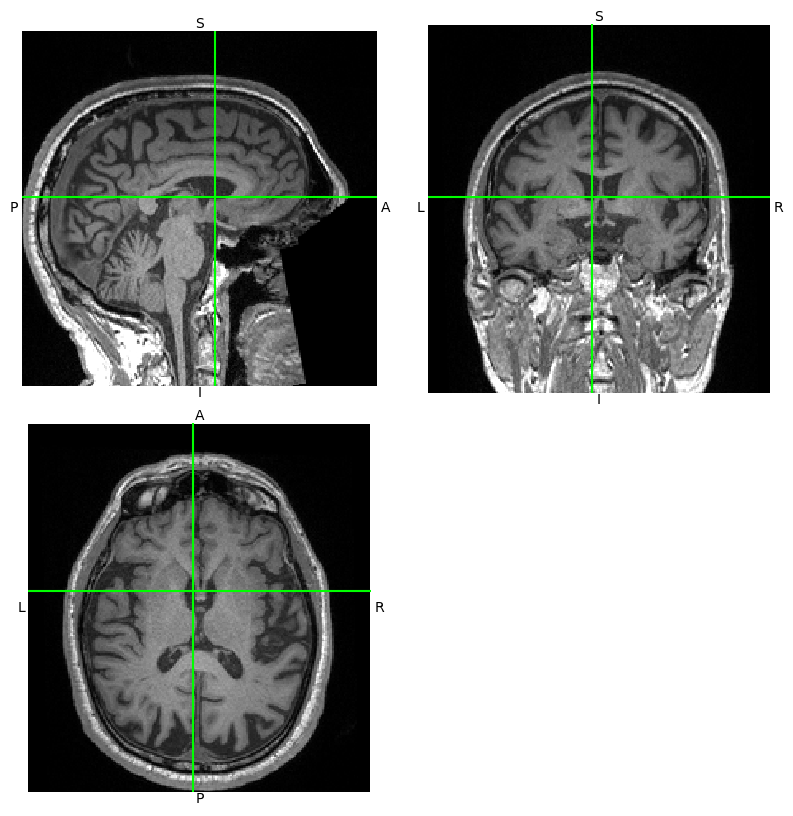

In [64]:
t1w.orthoview()

### 可视化切片
查看数据形状

In [65]:
def imshow_mri(data, img, vox, xyz, suptitle):
    """显示MRI切片并注释体素位置。

    参数:
    data : ndarray
        MRI数据，通常是一个3D数组。
    img : nibabel.image
        MRI图像对象，包含图像数据和相关信息。
    vox : tuple
        体素坐标 (i, j, k)，用于指定要显示的切片。
    xyz : dict
        包含注释的字典，其中键是注释类型，值是坐标。
    suptitle : str
        图形的副标题。
    """
    i, j, k = vox  # 解包体素坐标
    fig, ax = plt.subplots(1, figsize=(6, 6), layout="constrained")  # 创建图形和坐标轴

    # 获取图像的方向代码
    codes = nibabel.orientations.aff2axcodes(img.affine)

    ori_slice = dict(
        P="Coronal", A="Coronal", I="Axial", S="Axial", L="Sagittal", R="Sagittal"
    )
    ori_names = dict(
        P="posterior", A="anterior", I="inferior", S="superior", L="left", R="right"
    )
    title = ori_slice[codes[0]]

    # 显示指定切片的数据
    ax.imshow(data[i], vmin=data[i].min(), vmax=data[i].max()/2, cmap="gray", origin="lower")

    # 绘制切片的体素坐标的参考线
    ax.axvline(k, color="y")  # 垂直线
    ax.axhline(j, color="y")  # 水平线

    for kind, coords in xyz.items():
        annotation = "{}: {}, {}, {} mm".format(kind, *np.round(coords).astype(int))
        text = ax.text(k, j, annotation, va="baseline", ha="right", color=(1, 1, 0.7))
        text.set_path_effects(
            [
                path_effects.Stroke(linewidth=2, foreground="black"),
                path_effects.Normal(),
            ]
        )

    # 重新设置视图，使得 RAS 始终朝右和朝上
    x_order = -1 if codes[2] in "LIP" else 1
    y_order = -1 if codes[1] in "LIP" else 1
    ax.set(
        xlim=[0, data.shape[1] - 1][::x_order],
        ylim=[0, data.shape[2] - 1][::y_order],
        xlabel=f"k ({ori_names[codes[1]]}+)",
        ylabel=f"j ({ori_names[codes[2]]}+)",
        title=f"{title} view: i={i} ({ori_names[codes[0]]}+)",
    )

    fig.suptitle(suptitle)
    return fig

### 选择切片
> 这里因为我所使用的MRI数据需要进行x和y轴互换，才能使其RAS朝右朝上！

In [66]:
data = np.swapaxes(np.asarray(t1w.dataobj), -1, -2)
print(data.shape)

(208, 224, 224)


In [67]:
# 打印MRI图像的仿射变换矩阵，该矩阵用于将图像坐标转换为物理空间坐标
print(t1w.affine)

# 创建一个包含体素坐标的Numpy数组，表示要转换的体素位置
vox = np.array([99, 112, 112])

# 使用仿射变换矩阵将体素坐标转换为真实世界坐标（Ras空间坐标）
# apply_trans 是一个函数，通常用于将坐标从图像空间转换到物理空间
xyz_ras = apply_trans(t1w.affine, vox)

# 打印转换后的真实世界坐标，保留三位小数
# np.round 用于将坐标值四舍五入到三位小数
print(
    "Our voxel has real-world coordinates {}, {}, {} (mm)".format(*np.round(xyz_ras, 3))
)

[[ 9.98756468e-01 -3.25280130e-02  3.76567245e-02 -1.00599327e+02]
 [ 3.73746604e-02  9.89985526e-01 -1.36131585e-01 -1.08373611e+02]
 [-3.28513682e-02  1.37370363e-01  9.89974856e-01 -1.31419662e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]
Our voxel has real-world coordinates -1.148, -9.042, -8.409 (mm)


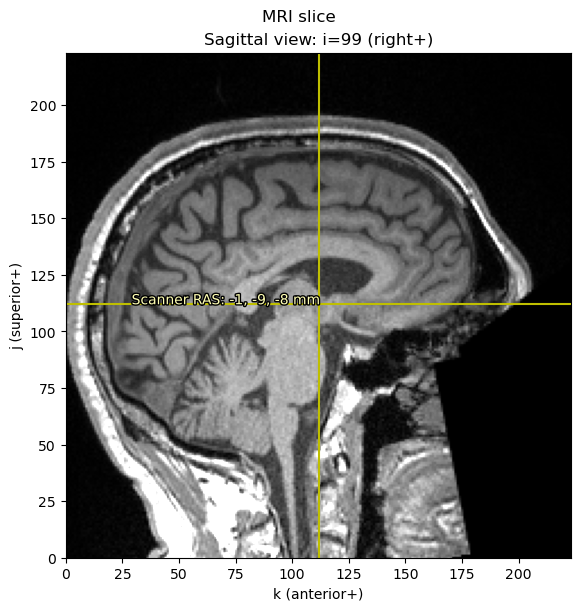

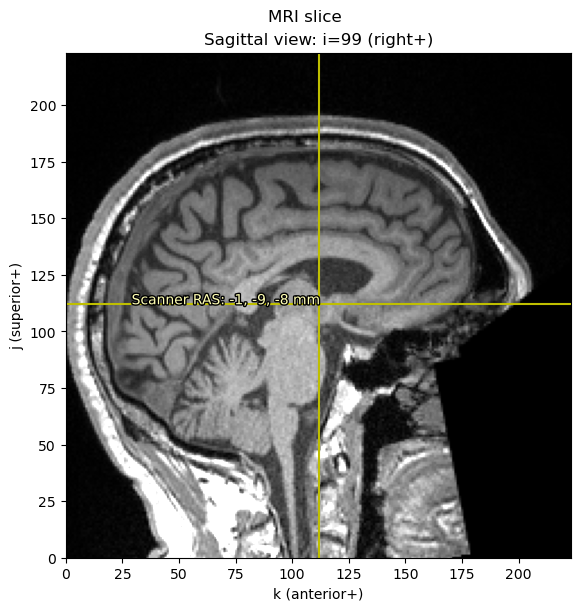

In [68]:
imshow_mri(data, t1w, vox, {"Scanner RAS": xyz_ras}, "MRI slice")

### 将给定的体素索引转换为 FreeSurfer MRI 坐标

[[ 9.98756468e-01 -3.25280130e-02  3.76567245e-02 -1.00599327e+02]
 [ 3.73746604e-02  9.89985526e-01 -1.36131585e-01 -1.08373611e+02]
 [-3.28513682e-02  1.37370363e-01  9.89974856e-01 -1.31419662e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]
[[  -0.9999953    0.           0.         103.99951  ]
 [   0.           0.           1.        -112.       ]
 [   0.          -1.           0.         112.       ]
 [   0.           0.           0.           1.       ]]


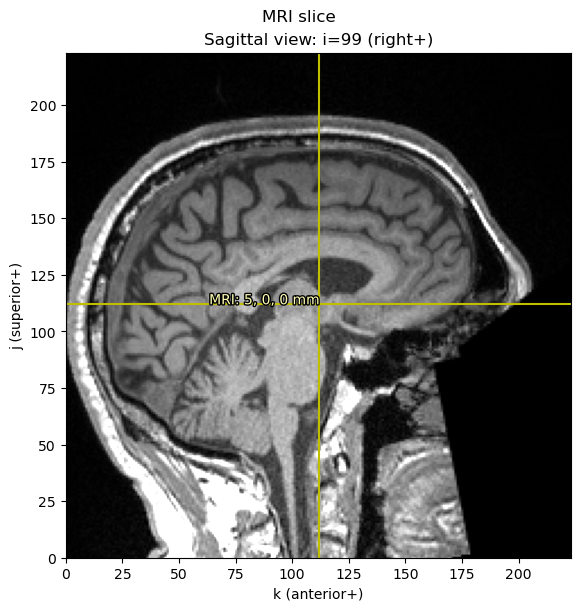

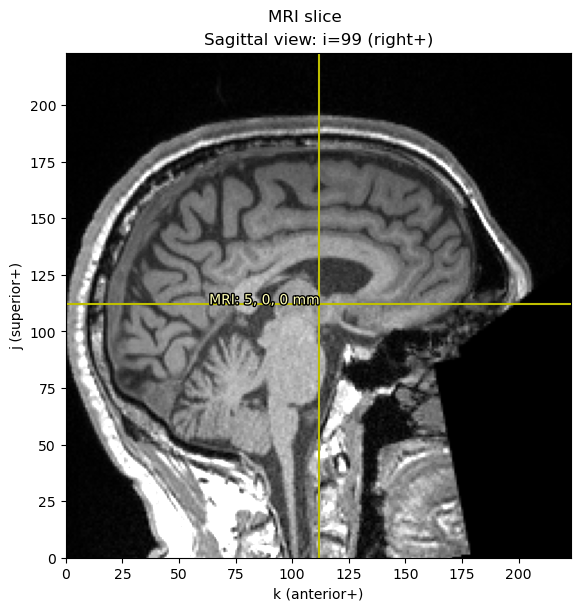

In [69]:
Torig = t1_mgh.header.get_vox2ras_tkr()
print(t1w.affine)
print(Torig)
xyz_mri = apply_trans(Torig, vox)
imshow_mri(data, t1w, vox, dict(MRI=xyz_mri), "MRI slice")

- 可以从任何给定空间中的某个点到达任何其他空间。让我们首先在矢状 MRI 切片上绘制鼻根点

In [70]:
fiducials = mne.coreg.get_mni_fiducials(subject, subjects_dir=subjects_dir)
nasion_mri = [d for d in fiducials if d["ident"] == FIFF.FIFFV_POINT_NASION][0]
print(nasion_mri)  # note it's in Freesurfer MRI coords

<DigPoint |     Nasion : (-0.6, 91.8, 18.2) mm     : MRI (surface RAS) frame>


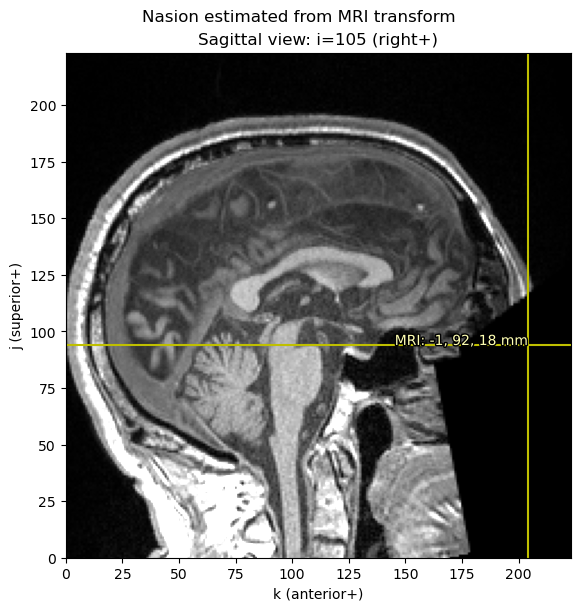

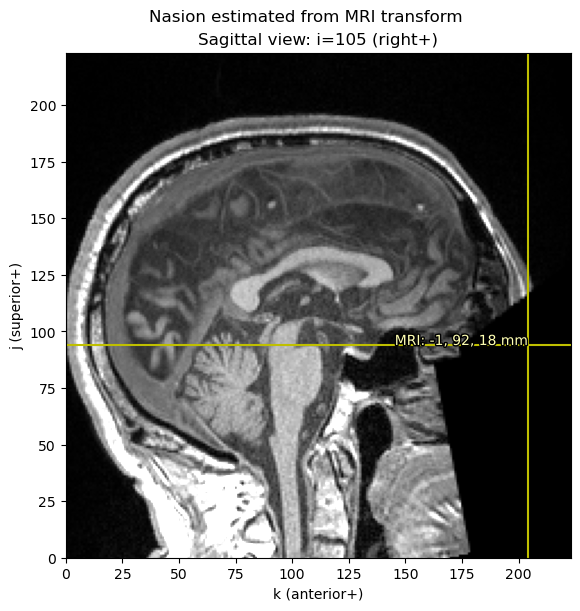

In [71]:
nasion_mri = nasion_mri["r"] * 1000  # meters → millimeters
nasion_vox = np.round(apply_trans(np.linalg.inv(Torig), nasion_mri)).astype(int)
imshow_mri(
    data, t1w, nasion_vox, dict(MRI=nasion_mri), "Nasion estimated from MRI transform"
)

- 查看头部坐标系中的鼻根
- MNE 中的头部坐标系是“Neuromag”头部坐标系。原点是连接 LPA 和 RPA 的线与通过鼻根的与其正交的线的交点。它也是 RAS 方向，这意味着 +X 穿过 RPA，+Y 穿过鼻根，+Z 与这些指向上方的线正交。

In [72]:
nasion_head = [
    d
    for d in info["dig"]
    if d["kind"] == FIFF.FIFFV_POINT_CARDINAL and d["ident"] == FIFF.FIFFV_POINT_NASION
][0]
print(nasion_head)  # note it's in "head" coordinates

<DigPoint |     Nasion : (0.0, 86.1, 0.0) mm       : head frame>


- 在“头部”坐标系中，鼻根点在和方向上的值为 0 z（这是有道理的，因为鼻根点用于定义y该系统中的轴）。
- 要从头部坐标系转换为体素，我们首先从文件（通常使用 MNE-Python 配准 GUI 创建）应用头部 → MRI（表面 RAS）变换trans，然后将米转换为毫米，最后应用逆变换Torig以获得体素。
- 在底层，诸如mne.setup_source_space()、 mne.setup_volume_source_space()和之类的函数mne.compute_source_morph() 大量使用了这些坐标框架。

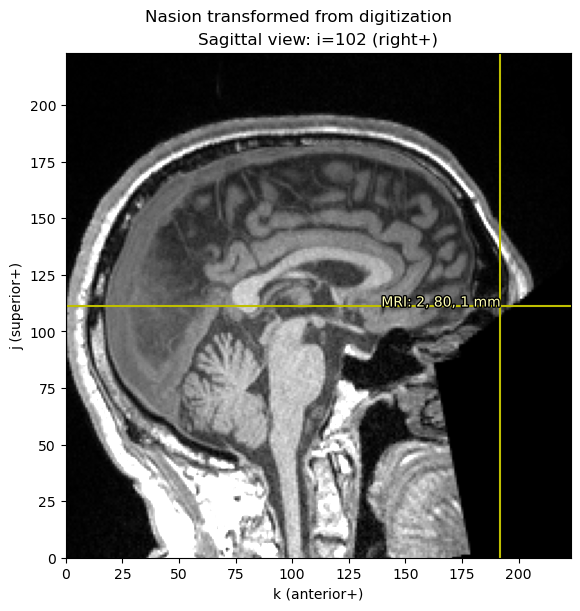

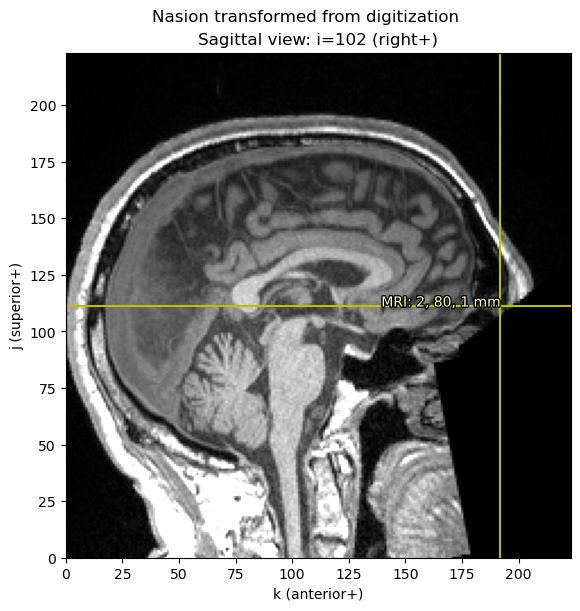

In [73]:
nasion_dig_mri = apply_trans(coreg.trans, nasion_head["r"]) * 1000

nasion_dig_vox = np.round(apply_trans(np.linalg.inv(Torig), nasion_dig_mri)).astype(int)
imshow_mri(
    data,
    t1w,
    nasion_dig_vox,
    dict(MRI=nasion_dig_mri),
    "Nasion transformed from digitization",
)

### 使用FreeSurfer表面重建

In [74]:
fname = subjects_dir / subject / "surf" / "rh.white"
rr_mm, tris = mne.read_surface(fname)
print(f"rr_mm.shape == {rr_mm.shape}")
print(f"tris.shape == {tris.shape}")
print(f"rr_mm.max() = {rr_mm.max()}")  # just to show that we are in mm

rr_mm.shape == (143363, 3)
tris.shape == (286722, 3)
rr_mm.max() = 67.02706909179688


In [75]:
renderer = mne.viz.backends.renderer.create_3d_figure(
    size=(600, 600), bgcolor="w", scene=False
)
gray = (0.5, 0.5, 0.5)
renderer.mesh(*rr_mm.T, triangles=tris, color=gray)
view_kwargs = dict(elevation=90, azimuth=0)  # camera at +X with +Z up
mne.viz.set_3d_view(
    figure=renderer.figure, distance=350, focalpoint=(0.0, 0.0, 40.0), **view_kwargs
)

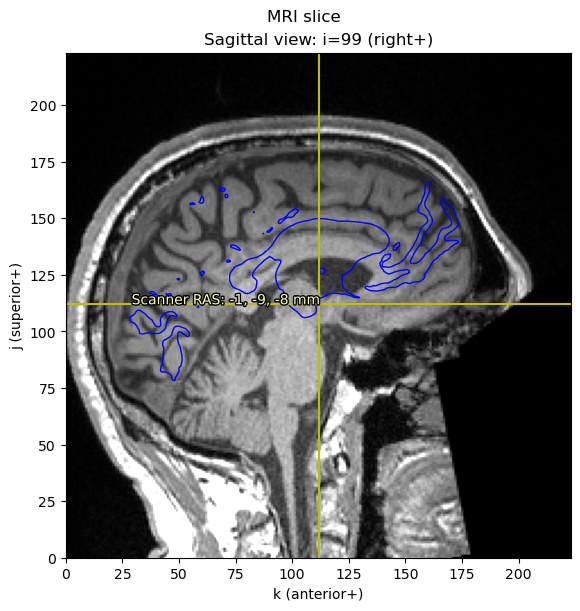

In [76]:
rr_vox = apply_trans(np.linalg.inv(Torig), rr_mm)
fig = imshow_mri(data, t1w, vox, {"Scanner RAS": xyz_ras}, "MRI slice")

fig.axes[0].tricontour(
    rr_vox[:, 2],
    np.max(rr_vox[:, 1])-rr_vox[:, 1]+65,
    tris,
    rr_vox[:, 0],
    levels=[vox[0]],# 等高线的高度值
    colors="b",
    linewidths=1.0,
    zorder=1,
)

# 源估计
## 计算噪声协方差矩阵

EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
Reducing data rank from 128 -> 128
Estimating covariance using SHRUNK
Done.
Estimating covariance using EMPIRICAL
Done.
Using cross-validation to select the best estimator.
Number of samples used : 23816
log-likelihood on unseen data (descending order):
   empirical: -186.512
   shrunk: -195.044
selecting best estimator: empirical
[done]
Computing rank from covariance with rank=None
    Using tolerance 9.5e-14 (2.2e-16 eps * 128 dim * 3.3  max singular value)
    Estimated rank (eeg): 126
    EEG: rank 126 computed from 128 data channels with 0 projectors


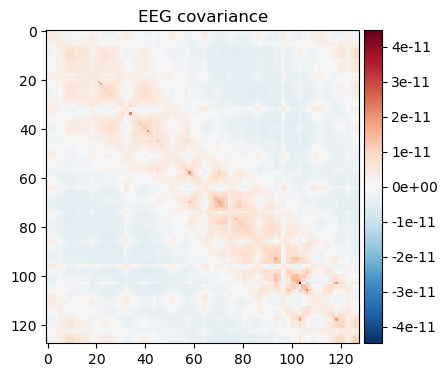

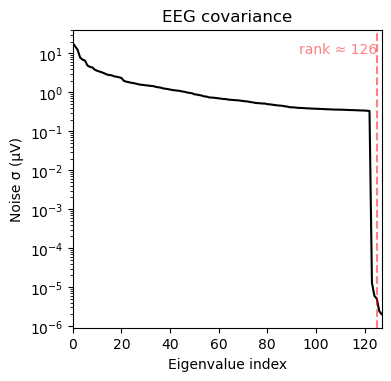

In [77]:
raw.set_eeg_reference(projection=True)
noise_cov = mne.compute_covariance(
    epochs, tmax=-0.1, method=["shrunk", "empirical"], rank=None, verbose=True,n_jobs = -1
)

fig_cov, fig_spectra = mne.viz.plot_cov(noise_cov, raw.info)

In [78]:
inv = mne.minimum_norm.make_inverse_operator(epochs['1'].info, fwd, noise_cov, verbose=True)

Converting forward solution to surface orientation
    Average patch normals will be employed in the rotation to the local surface coordinates....
    Converting to surface-based source orientations...
    [done]
Computing inverse operator with 128 channels.
    128 out of 128 channels remain after picking
Selected 128 channels
Creating the depth weighting matrix...
    128 EEG channels
    limit = 8188/8187 = 2.503309
    scale = 241565 exp = 0.8
Applying loose dipole orientations to surface source spaces: 0.2
Whitening the forward solution.
Computing rank from covariance with rank=None
    Using tolerance 9.5e-14 (2.2e-16 eps * 128 dim * 3.3  max singular value)
    Estimated rank (eeg): 126
    EEG: rank 126 computed from 128 data channels with 0 projectors
    Setting small EEG eigenvalues to zero (without PCA)


/tmp/ipykernel_133/611332223.py:1: RuntimeWarning: The largest eigenvalue of the 128-channel eeg covariance (rank=126) is over 10 orders of magnitude larger than the smallest (3.34e-10 > 1e10 * 2.54e-23), the resulting whitener will likely be unstable
  inv = mne.minimum_norm.make_inverse_operator(epochs['1'].info, fwd, noise_cov, verbose=True)
/tmp/ipykernel_133/611332223.py:1: RuntimeWarning: No average EEG reference present in info["projs"], covariance may be adversely affected. Consider recomputing covariance using with an average eeg reference projector added.
  inv = mne.minimum_norm.make_inverse_operator(epochs['1'].info, fwd, noise_cov, verbose=True)
/tmp/ipykernel_133/611332223.py:1: RuntimeWarning: The largest eigenvalue of the 128-channel eeg covariance (rank=126) is over 10 orders of magnitude larger than the smallest (3.34e-10 > 1e10 * 2.54e-23), the resulting whitener will likely be unstable
  inv = mne.minimum_norm.make_inverse_operator(epochs['1'].info, fwd, noise_cov, 

Creating the source covariance matrix
Adjusting source covariance matrix.
Computing SVD of whitened and weighted lead field matrix.
    largest singular value = 11.2131
    scaling factor to adjust the trace = 4.23076e+30 (nchan = 128 nzero = 2)


Preparing the inverse operator for use...
    Scaled noise and source covariance from nave = 1 to nave = 458
    Created the regularized inverter
    The projection vectors do not apply to these channels.
    Created the whitener using a noise covariance matrix with rank 126 (2 small eigenvalues omitted)
Applying inverse operator to "1"...
    Picked 128 channels from the data
    Computing inverse...
    Eigenleads need to be weighted ...
    Computing residual...
    Explained   0.3% variance
    Combining the current components...
[done]
Using control points [5.04270271e-18 9.73891969e-18 2.89960605e-17]


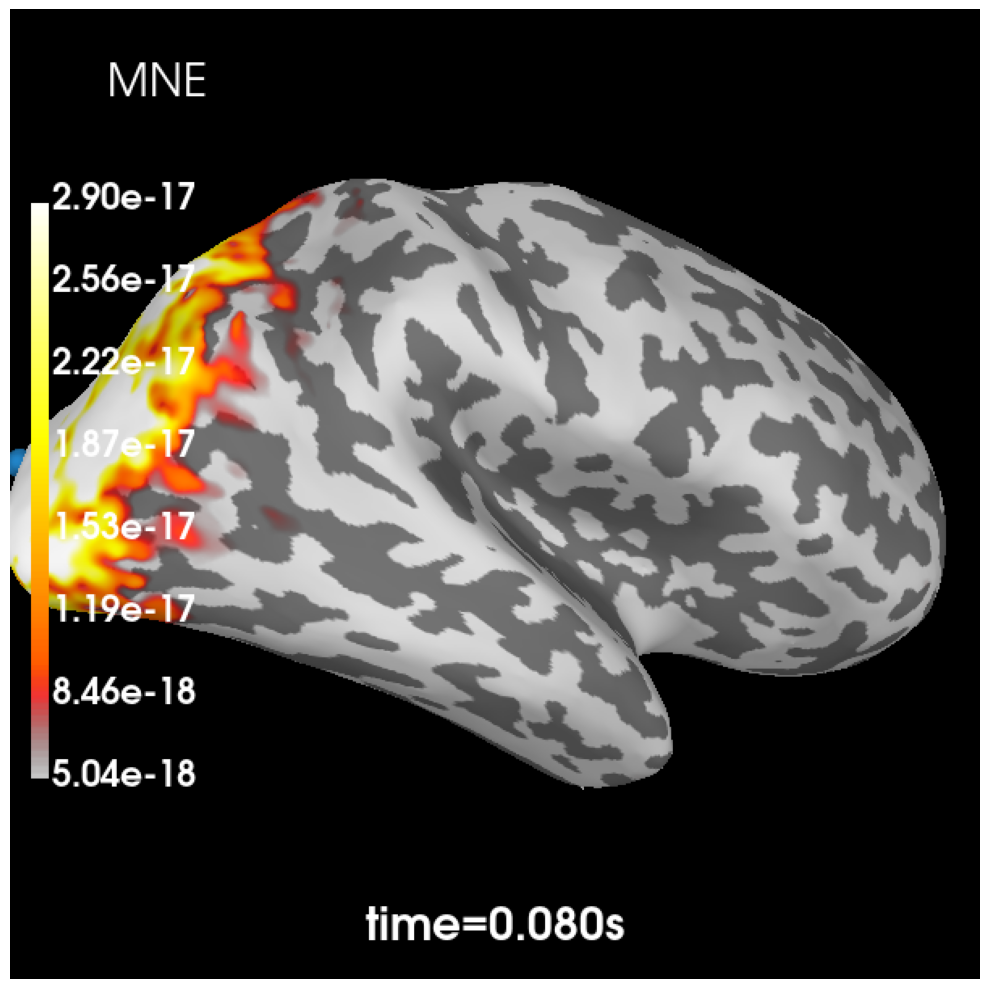

In [112]:
# epochs['1'].set_eeg_reference(ref_channels='average', projection=True)
snr = 3.0
lambda2 = 1.0 / snr**2
kwargs = dict(
    initial_time=0.08,
    hemi="rh",
    subjects_dir=subjects_dir,
    size=(600, 600),
    clim=dict(kind="percent", lims=[90, 95, 99]),
    smoothing_steps=10,
)

# heartbeat = epochs['1'].average()
stc = abs(mne.minimum_norm.apply_inverse(epochs['1'].average(), inv, lambda2, "MNE", verbose=True))
brain = stc.plot(**kwargs)
brain.add_text(0.1, 0.9, "MNE", "title", font_size=14)
show_PyVista(brain)

## 从源空间中计算连通性

In [83]:
# Compute inverse solution and for each epoch. By using "return_generator=True"
# stcs will be a generator object instead of a list.
snr = 2.0  # use lower SNR for single epochs
lambda2 = 1.0 / snr**2
method = "MNE"  # could also be dSPM or sLORETA)
epochs.set_eeg_reference(projection=True)
stcs = mne.minimum_norm.apply_inverse_epochs(
    epochs['1'], inv, lambda2, method, pick_ori="normal", return_generator=True
)

EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.


In [84]:
# Get labels for FreeSurfer 'aparc' cortical parcellation with 34 labels/hemi
labels = mne.read_labels_from_annot(subject, parc="aparc", subjects_dir=subjects_dir)
label_colors = [label.color for label in labels]
labels

Reading labels from parcellation...
   read 34 labels from /usr/local/freesurfer/8.0.0-beta/subjects/clb00006/label/lh.aparc.annot
   read 34 labels from /usr/local/freesurfer/8.0.0-beta/subjects/clb00006/label/rh.aparc.annot


[<Label | clb00006, 'bankssts-lh', lh : 1413 vertices>,
 <Label | clb00006, 'bankssts-rh', rh : 1482 vertices>,
 <Label | clb00006, 'caudalanteriorcingulate-lh', lh : 840 vertices>,
 <Label | clb00006, 'caudalanteriorcingulate-rh', rh : 957 vertices>,
 <Label | clb00006, 'caudalmiddlefrontal-lh', lh : 2728 vertices>,
 <Label | clb00006, 'caudalmiddlefrontal-rh', rh : 3146 vertices>,
 <Label | clb00006, 'cuneus-lh', lh : 2903 vertices>,
 <Label | clb00006, 'cuneus-rh', rh : 2962 vertices>,
 <Label | clb00006, 'entorhinal-lh', lh : 852 vertices>,
 <Label | clb00006, 'entorhinal-rh', rh : 891 vertices>,
 <Label | clb00006, 'frontalpole-lh', lh : 370 vertices>,
 <Label | clb00006, 'frontalpole-rh', rh : 466 vertices>,
 <Label | clb00006, 'fusiform-lh', lh : 4336 vertices>,
 <Label | clb00006, 'fusiform-rh', rh : 4350 vertices>,
 <Label | clb00006, 'inferiorparietal-lh', lh : 5640 vertices>,
 <Label | clb00006, 'inferiorparietal-rh', rh : 7953 vertices>,
 <Label | clb00006, 'inferiortempora

In [85]:
labels_names = [label.name for label in labels]
labels_names

['bankssts-lh',
 'bankssts-rh',
 'caudalanteriorcingulate-lh',
 'caudalanteriorcingulate-rh',
 'caudalmiddlefrontal-lh',
 'caudalmiddlefrontal-rh',
 'cuneus-lh',
 'cuneus-rh',
 'entorhinal-lh',
 'entorhinal-rh',
 'frontalpole-lh',
 'frontalpole-rh',
 'fusiform-lh',
 'fusiform-rh',
 'inferiorparietal-lh',
 'inferiorparietal-rh',
 'inferiortemporal-lh',
 'inferiortemporal-rh',
 'insula-lh',
 'insula-rh',
 'isthmuscingulate-lh',
 'isthmuscingulate-rh',
 'lateraloccipital-lh',
 'lateraloccipital-rh',
 'lateralorbitofrontal-lh',
 'lateralorbitofrontal-rh',
 'lingual-lh',
 'lingual-rh',
 'medialorbitofrontal-lh',
 'medialorbitofrontal-rh',
 'middletemporal-lh',
 'middletemporal-rh',
 'paracentral-lh',
 'paracentral-rh',
 'parahippocampal-lh',
 'parahippocampal-rh',
 'parsopercularis-lh',
 'parsopercularis-rh',
 'parsorbitalis-lh',
 'parsorbitalis-rh',
 'parstriangularis-lh',
 'parstriangularis-rh',
 'pericalcarine-lh',
 'pericalcarine-rh',
 'postcentral-lh',
 'postcentral-rh',
 'posteriorcin

In [86]:
# Average the source estimates within each label using sign-flips to reduce
# signal cancellations, also here we return a generator
src = inv["src"]
label_ts = mne.extract_label_time_course(
    stcs, labels, src, mode="mean_flip", return_generator=True
)

In [87]:
from mne_connectivity import spectral_connectivity_epochs

fmin = 30
fmax = 100.0
sfreq = raw.info["sfreq"]  # the sampling frequency
con_methods = ["plv"]
con = spectral_connectivity_epochs(
    label_ts,
    method=con_methods,
    mode="fourier",
    sfreq=sfreq,
    fmin=fmin,
    fmax=fmax,
    faverage=True,
    # mt_adaptive=True,
    n_jobs=-1,
)

Connectivity computation...
Preparing the inverse operator for use...
    Scaled noise and source covariance from nave = 1 to nave = 1
    Created the regularized inverter
    The projection vectors do not apply to these channels.
    Created the whitener using a noise covariance matrix with rank 126 (2 small eigenvalues omitted)
Picked 128 channels from the data
Computing inverse...
    Eigenleads need to be weighted ...
Processing epoch : 1 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 2 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 3 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 4 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 5 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 6 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 7 / 458
Extracting time courses for 68 labels (mode: mean

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Processing epoch : 65 / 458


[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done  64 out of  64 | elapsed:    2.5s finished


Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 66 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 67 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 68 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 69 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 70 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 71 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 72 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 73 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 74 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 75 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 76 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 7

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Processing epoch : 129 / 458
Extracting time courses for 68 labels (mode: mean_flip)


[Parallel(n_jobs=-1)]: Done  64 out of  64 | elapsed:    0.3s finished


Processing epoch : 130 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 131 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 132 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 133 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 134 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 135 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 136 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 137 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 138 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 139 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 140 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 141 / 458
Extracting time courses for 68 label

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Processing epoch : 193 / 458
Extracting time courses for 68 labels (mode: mean_flip)


[Parallel(n_jobs=-1)]: Done  64 out of  64 | elapsed:    0.3s finished


Processing epoch : 194 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 195 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 196 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 197 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 198 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 199 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 200 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 201 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 202 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 203 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 204 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 205 / 458
Extracting time courses for 68 label

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Processing epoch : 257 / 458
Extracting time courses for 68 labels (mode: mean_flip)


[Parallel(n_jobs=-1)]: Done  64 out of  64 | elapsed:    0.3s finished


Processing epoch : 258 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 259 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 260 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 261 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 262 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 263 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 264 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 265 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 266 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 267 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 268 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 269 / 458
Extracting time courses for 68 label

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Processing epoch : 321 / 458


[Parallel(n_jobs=-1)]: Done  64 out of  64 | elapsed:    0.3s finished


Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 322 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 323 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 324 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 325 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 326 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 327 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 328 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 329 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 330 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 331 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 332 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processin

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Processing epoch : 385 / 458
Extracting time courses for 68 labels (mode: mean_flip)


[Parallel(n_jobs=-1)]: Done  64 out of  64 | elapsed:    0.3s finished


Processing epoch : 386 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 387 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 388 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 389 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 390 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 391 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 392 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 393 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 394 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 395 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 396 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 397 / 458
Extracting time courses for 68 label

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Processing epoch : 449 / 458
Extracting time courses for 68 labels (mode: mean_flip)


[Parallel(n_jobs=-1)]: Done  64 out of  64 | elapsed:    0.3s finished


Processing epoch : 450 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 451 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 452 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 453 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 454 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 455 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 456 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 457 / 458
Extracting time courses for 68 labels (mode: mean_flip)
Processing epoch : 458 / 458
Extracting time courses for 68 labels (mode: mean_flip)
[done]
    computing cross-spectral density for epochs 449..458
    assembling connectivity matrix
[Connectivity computation done]


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    0.1s finished


In [88]:
con_res = con.get_data(output="dense")[:, :, 0]
con_res.shape

(68, 68)

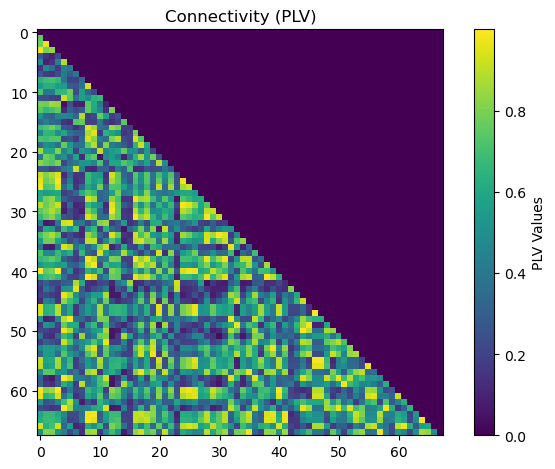

In [120]:
fig, ax = plt.subplots()
im = ax.imshow(con_res, cmap='viridis')
cbar = plt.colorbar(im, ax=ax)
cbar.set_label('PLV Values')

ax.set_title("Connectivity (PLV)")
fig.tight_layout()
plt.show()

In [121]:
type(con_res)
np.savetxt('/zjhszu2023/cov.csv', con_res, delimiter=',', fmt='%f')

## 绘制功能连接性图

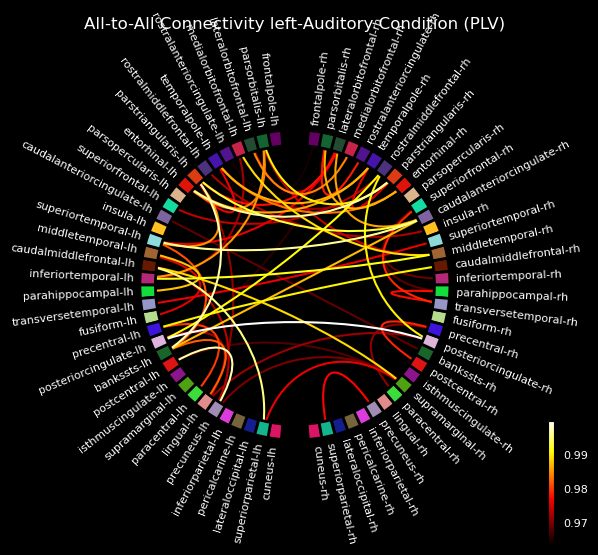

In [122]:
from mne.viz import circular_layout
from mne_connectivity.viz import plot_connectivity_circle


label_names = [label.name for label in labels]

lh_labels = [name for name in label_names if name.endswith("lh")]

label_ypos = list()
for name in lh_labels:
    idx = label_names.index(name)
    ypos = np.mean(labels[idx].pos[:, 1])
    label_ypos.append(ypos)

lh_labels = [label for (yp, label) in sorted(zip(label_ypos, lh_labels))]

rh_labels = [label[:-2] + "rh" for label in lh_labels]

node_order = list()
node_order.extend(lh_labels[::-1])
node_order.extend(rh_labels)

node_angles = circular_layout(
    label_names, node_order, start_pos=90, group_boundaries=[0, len(label_names) / 2]
)

fig, ax = plt.subplots(figsize=(8, 8), facecolor="black", subplot_kw=dict(polar=True))
plot_connectivity_circle(
    con_res,
    label_names,
    n_lines=60,
    node_angles=node_angles,
    node_colors=label_colors,
    title="All-to-All Connectivity left-Auditory " "Condition (PLV)",
    ax=ax,
)
fig.tight_layout()